First we need to import the necessary modules.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random
from beeswarm import beeswarm
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import ttest_ind
from matplotlib.patches import Ellipse,Patch,Arrow
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png')
from IPython.display import HTML, display
import tabulate
from decimal import Decimal
import warnings
warnings.filterwarnings('ignore') #in order to suppress warnings output of t-test if one sample is 0
pd.set_option('display.max_rows', 1000)

The we read sample files and extract separate data containers for the 4 tissues in question. The data have been normalized. (How?)

In [2]:
sampleinfo=pd.read_csv('sample_info_consensus.csv',sep=',')
sampleinfo=sampleinfo.query('paper == "fromm" or paper == "schee" or paper == "selitsky" or paper == "neerincx"')
countmat=pd.read_csv('consensus.rpm_uniq_seqs_correct_names.csv',sep=',')
countmat.rename(columns = {'Unnamed: 0':'mirna'}, inplace = True)
liver_normal=countmat[[row[0] for row in sampleinfo.values if row[3]=='liver' and row[2]=='normal']]
liver_meta=countmat[[row[0] for row in sampleinfo.values if row[3]=='liver' and row[2]=='metastasis']]
crc_normal=countmat[[row[0] for row in sampleinfo.values if row[3]=='colorect' and row[2]=='normal' and row[4]!='schee']]
crc_tumor=countmat[[row[0] for row in sampleinfo.values if row[3]=='colorect' and row[2]=='tumor']]
liver_normal.index=liver_meta.index=crc_normal.index=crc_tumor.index=list(countmat['mirna'])

For each miRNA, certain values are calculated such as t-test relevance values between different tissue types, fold changes between average values and count of samples. This is later used to filter the data. Also, miRNAs that are known to be tissue-related are excluded.

In [3]:
mirnanamelist=[]
mirnadatalist=[]
tissuemirna=["Hsa-Mir-122_5p ","Hsa-Mir-126_5p ","Hsa-Mir-126_3p ","Hsa-Mir-144_5p ","Hsa-Mir-144_3p ","Hsa-Mir-486_5p ",
             "Hsa-Mir-143_3p ","Hsa-Mir-145_5p ","Hsa-Mir-150_5p ","Hsa-Mir-142-P1_5p ","Hsa-Mir-223_3p "]
for i in range(len(countmat.values)):
    s1,p1=ttest_ind(crc_normal.values[i],crc_tumor.values[i])
    s2,p2=ttest_ind(crc_tumor.values[i],liver_meta.values[i])
    s3,p3=ttest_ind(crc_normal.values[i],liver_normal.values[i])
    s4,p4=ttest_ind(liver_meta.values[i],liver_normal.values[i])
    fc_cm_cb=np.mean(crc_tumor.values[i])/np.mean(crc_normal.values[i])
    if fc_cm_cb<1:fc_cm_cb=-1/(fc_cm_cb+0.00001)
    fc_lm_cm=np.mean(liver_meta.values[i])/np.mean(crc_tumor.values[i])
    if fc_lm_cm<1:fc_lm_cm=-1/(fc_lm_cm+0.00001)
    fc_lb_cb=np.mean(liver_normal.values[i])/np.mean(crc_normal.values[i])
    if fc_lb_cb<1:fc_lb_cb=-1/(fc_lb_cb+0.00001)
    fc_lb_lm=np.mean(liver_normal.values[i])/np.mean(liver_meta.values[i])
    if fc_lb_lm<1:fc_lb_lm=-1/(fc_lb_lm+0.00001)
    n_cb=len(crc_normal.values[i])
    n_cm=len(crc_tumor.values[i])
    n_lb=len(liver_normal.values[i])
    n_lm=len(liver_meta.values[i])
    totcounts=np.mean(liver_normal.values[i])+np.mean(liver_meta.values[i])+np.mean(crc_normal.values[i])+np.mean(crc_tumor.values[i])
    tm=False
    if countmat['mirna'][i] in tissuemirna:tm=True
    mirnadatalist.append([p1,p2,p3,p4,fc_cm_cb,fc_lm_cm,fc_lb_cb,fc_lb_lm,n_cb,n_cm,n_lb,n_lm,totcounts,tm])
    mirnanamelist.append(countmat['mirna'][i])
mirnalist=pd.DataFrame(data=mirnadatalist,index=mirnanamelist,columns=[ 
                                               'p_cm_cb',
                                               'p_cm_lm',
                                               'p_cb_lb',
                                               'p_lm_lb',
                                               'fc_cm_cb',
                                               'fc_lm_cm',
                                               'fc_lb_cb',
                                               'fc_lb_lm',
                                               'N_cb',
                                               'N_cm',
                                               'N_lb',
                                               'N_lm',
                                               'total_counts',
                                               'tissue_mirna'])

This is what it looks like for one example miRNA.

In [4]:
mirnalist.T['Hsa-Mir-122_5p ']

p_cm_cb            0.227864
p_cm_lm         4.72873e-07
p_cb_lb         1.28378e-15
p_lm_lb         7.69653e-13
fc_cm_cb           -2.29099
fc_lm_cm            243.423
fc_lb_cb             4146.9
fc_lb_lm            39.0297
N_cb                     24
N_cm                    101
N_lb                     24
N_lm                     19
total_counts         140249
tissue_mirna           True
Name: Hsa-Mir-122_5p , dtype: object

Next we define the visualization function called "combplot". The individual experimental miRNA counts are drawn as vertical (liver) and horizontal (colon) lines. The area where they overlap is indicated by an ellipse with the means as center and the standard deviation as half axes. This is done both for benign and malign tissues. 

The straight green line indicates the equal count where colon and liver counts are the same (FC=1). An arrow indicates the trend from benign to malign. If the ellipse is top left it means the expression for this miRNA is higher in the colon tissue than in the liver tissue while it is lower if the ellipse is in the bottom right.

Additionally, a classical box plot of the four tissues is shown and overlaid with a beeswarm plot that shows individual measurements.

One example plot is given.

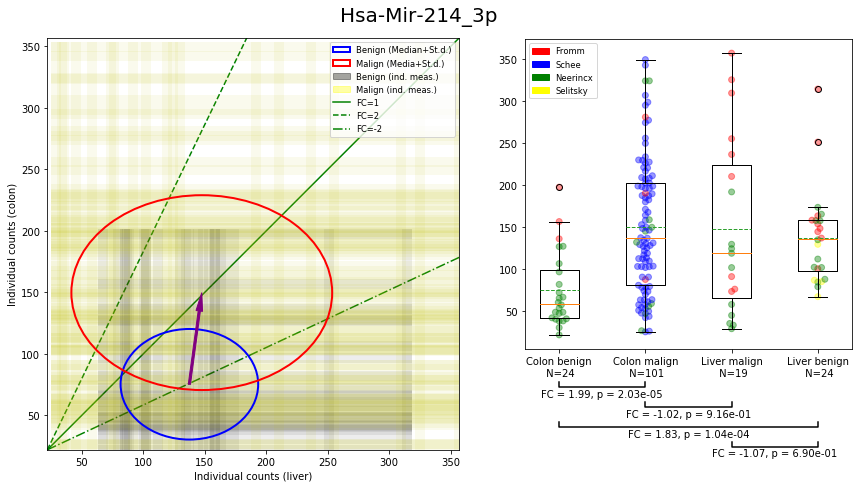

In [5]:
def combplot(mirna):
    #prepare figure
    fig = plt.figure(figsize=(13,7))
    fig.suptitle(mirna,fontsize=20)
    #prepare ellipses subplot
    ax = fig.add_axes([0.1,0.1,0.44,0.44*13/7])
    plt.xlabel('Individual counts (liver)')
    plt.ylabel('Individual counts (colon)')
    plotlimitmax=max(liver_normal.T[mirna].max(),crc_normal.T[mirna].max(),liver_meta.T[mirna].max(),crc_tumor.T[mirna].max())
    plotlimitmin=min(liver_normal.T[mirna].min(),crc_normal.T[mirna].min(),liver_meta.T[mirna].min(),crc_tumor.T[mirna].min())
    ax.set_xlim(plotlimitmin, plotlimitmax)
    ax.set_ylim(plotlimitmin, plotlimitmax)
    #ax.set_aspect('equal')
    #prepare ellipses
    xn=liver_normal.T[mirna].mean()
    yn=crc_normal.T[mirna].mean()
    xerrn=2*liver_normal.T[mirna].std()
    yerrn=2*crc_normal.T[mirna].std()
    xc=liver_meta.T[mirna].mean()
    yc=crc_tumor.T[mirna].mean()
    xerrc=2*liver_meta.T[mirna].std()
    yerrc=2*crc_tumor.T[mirna].std()
    ne=Ellipse(xy=(xn,yn), width=xerrn, height=yerrn,color='blue',lw=2,fill=False,alpha=1,label='Benign (Median+St.d.)')
    ce=Ellipse(xy=(xc,yc), width=xerrc, height=yerrc,color='red',lw=2,fill=False,alpha=1,label='Malign (Media+St.d.)')
    ax.add_artist(ne)
    ax.add_artist(ce)
    ne.set_zorder(10000)
    ce.set_zorder(10000)
    #draw arrow between ellipses centers
    ar=Arrow(xn,yn,xc-xn,yc-yn,width=plotlimitmax/40,zorder=10001,color='purple')
    ax.add_artist(ar)
    #draw green line of constant fold change
    gfc1,=ax.plot([plotlimitmin,plotlimitmax],[plotlimitmin,1*plotlimitmax],'g',label="FC=1")
    gfc2,=ax.plot([plotlimitmin,plotlimitmax],[plotlimitmin,2*plotlimitmax],'g--',label="FC=2")
    gfc05,=ax.plot([plotlimitmin,plotlimitmax],[plotlimitmin,0.5*plotlimitmax],'g-.',label="FC=-2")
    #draw vertical and horizontal lines for each individual measurement
    lw,al=10,0.07
    nleg=Patch(color='black',alpha=al*5,label='Benign (ind. meas.)')
    cleg=Patch(color='yellow',alpha=al*5,label='Malign (ind. meas.)')
    ax.legend(handles=[ne,ce,nleg,cleg,gfc1,gfc2,gfc05],fontsize='small')
    for xln in liver_normal.T[mirna].values:
        ax.plot([xln,xln],[min(crc_normal.T[mirna].values),max(crc_normal.T[mirna].values)],'k-',linewidth=lw,alpha=al)
    for ycn in crc_normal.T[mirna].values:
        ax.plot([min(liver_normal.T[mirna].values),max(liver_normal.T[mirna].values)],[ycn,ycn],'k-',linewidth=lw,alpha=al)
    for xlc in liver_meta.T[mirna].values:
        ax.plot([xlc,xlc],[min(crc_tumor.T[mirna].values),max(crc_tumor.T[mirna].values)],'y-',linewidth=lw,alpha=al)
    for ycc in crc_tumor.T[mirna].values:
        ax.plot([min(liver_meta.T[mirna].values),max(liver_meta.T[mirna].values)],[ycc,ycc],'y-',linewidth=lw,alpha=al)
    #prepare subplot for boxplot and beeswarm plot
    ax2=fig.add_axes([0.61, 0.3, 0.35, 0.615])
    ax2.boxplot([crc_normal.T[mirna].values,
                crc_tumor.T[mirna].values,
                liver_meta.T[mirna].values,
                liver_normal.T[mirna].values],showmeans=True,meanline=True,
                labels=['Colon benign\n N='+str(int(mirnalist.T[mirna][8])),
                        'Colon malign\n N='+str(int(mirnalist.T[mirna][9])),
                       'Liver malign\n N='+str(int(mirnalist.T[mirna][11])),
                       'Liver benign\n N='+str(int(mirnalist.T[mirna][10]))])
    def GetColor(x):
        colors = []
        for item in x.index:
            coh=sampleinfo['paper'][sampleinfo['sample']==item].values[0]
            if coh == 'fromm': colors.append('red')
            if coh == 'schee':colors.append('blue')
            if coh == 'neerincx':colors.append('green')
            if coh == 'selitsky':colors.append('yellow')
        colors=np.array(colors)
        dat=x.values
        inds = dat.argsort()
        sorteddatcol = colors[inds]
        colors=sorteddatcol.tolist()
        return colors
    colors = (GetColor(crc_normal.T[mirna]) + GetColor(crc_tumor.T[mirna]) + GetColor(liver_meta.T[mirna]) + GetColor(liver_normal.T[mirna]))
    beeswarm([np.copy(crc_normal.T[mirna].values),
              np.copy(crc_tumor.T[mirna].values),
              np.copy(liver_meta.T[mirna].values),
              np.copy(liver_normal.T[mirna].values)],
              ax=ax2,s=10,alpha=0.4,col=colors,positions=[1,2,3,4])
    red_patch = Patch(color='red', label='Fromm')
    blue_patch =Patch(color='blue', label='Schee')
    green_patch = Patch(color='green', label='Neerincx')
    yellow_patch = Patch(color='yellow', label='Selitsky')
    ax2.legend(handles=[red_patch,blue_patch,green_patch,yellow_patch],fontsize='small')
    
    ax3=fig.add_axes([0.61, 0.1, 0.35, 0.14])
    ax3.plot([1,1,2,2],[4.5,4,4,4.5],'k')
    ax3.text(1.5,3,'FC = %.2f' % Decimal(str(mirnalist.T[mirna][4]))+', p = %.2e' % Decimal(str(mirnalist.T[mirna][0])),ha='center')
    ax3.plot([2,2,3,3],[2.5,2,2,2.5],'k')
    ax3.text(2.5,1,'FC = %.2f' % Decimal(str(mirnalist.T[mirna][5]))+', p = %.2e' % Decimal(str(mirnalist.T[mirna][1])),ha='center')
    ax3.plot([1,1,4,4],[0.5,0,0,0.5],'k')
    ax3.text(2.5,-1,'FC = %.2f' % Decimal(str(mirnalist.T[mirna][6]))+', p = %.2e' % Decimal(str(mirnalist.T[mirna][2])),ha='center')
    ax3.plot([3,3,4,4],[-1.5,-2,-2,-1.5],'k')
    ax3.text(3.5,-3,'FC = %.2f' % Decimal(str(mirnalist.T[mirna][7]))+', p = %.2e' % Decimal(str(mirnalist.T[mirna][3])),ha='center')
    ax3.set_xlim(0.6, 4.4)
    ax3.axis('off')
    
    plt.show()
combplot('Hsa-Mir-214_3p ')

Next comes a plot style where only the colon reads are shown.

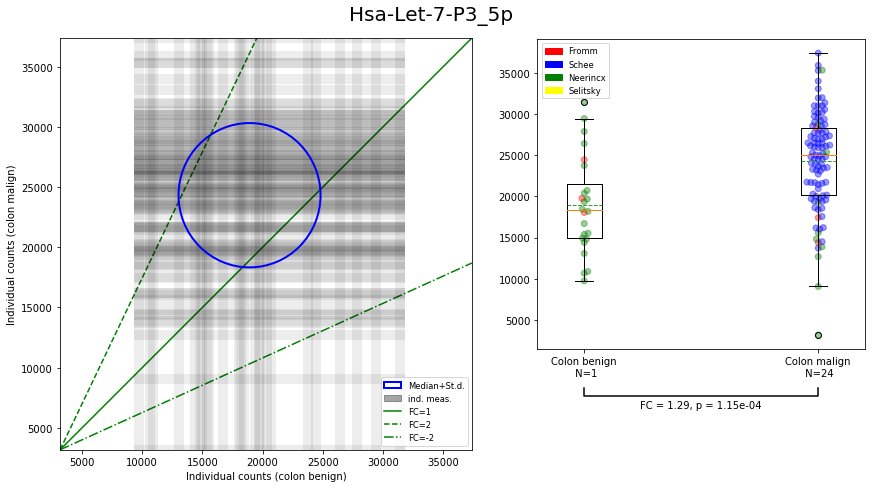

In [6]:
def combplotcol(mirna):
    #prepare figure
    fig = plt.figure(figsize=(13,7))
    fig.suptitle(mirna,fontsize=20)
    #prepare ellipses subplot
    ax = fig.add_axes([0.1,0.1,0.44,0.44*13/7])
    plt.xlabel('Individual counts (colon benign)')
    plt.ylabel('Individual counts (colon malign)')
    plotlimitmax=max(crc_normal.T[mirna].max(),crc_tumor.T[mirna].max())
    plotlimitmin=min(crc_normal.T[mirna].min(),crc_tumor.T[mirna].min())
    ax.set_xlim(plotlimitmin, plotlimitmax)
    ax.set_ylim(plotlimitmin, plotlimitmax)
    #ax.set_aspect('equal')
    #prepare ellipses
    yn=crc_tumor.T[mirna].mean()
    xn=crc_normal.T[mirna].mean()
    yerrn=2*crc_tumor.T[mirna].std()
    xerrn=2*crc_normal.T[mirna].std()
    ne=Ellipse(xy=(xn,yn), width=xerrn, height=yerrn,color='blue',lw=2,fill=False,alpha=1,label='Median+St.d.')
    ax.add_artist(ne)
    ne.set_zorder(10000)
    #draw green line of constant fold change
    gfc1,=ax.plot([plotlimitmin,plotlimitmax],[plotlimitmin,1*plotlimitmax],'g',label="FC=1")
    gfc2,=ax.plot([plotlimitmin,plotlimitmax],[plotlimitmin,2*plotlimitmax],'g--',label="FC=2")
    gfc05,=ax.plot([plotlimitmin,plotlimitmax],[plotlimitmin,0.5*plotlimitmax],'g-.',label="FC=-2")
    #draw vertical and horizontal lines for each individual measurement
    lw,al=10,0.07
    nleg=Patch(color='black',alpha=al*5,label='ind. meas.')
    ax.legend(handles=[ne,nleg,gfc1,gfc2,gfc05],fontsize='small')
    for xln in crc_normal.T[mirna].values:
        ax.plot([xln,xln],[min(crc_tumor.T[mirna].values),max(crc_tumor.T[mirna].values)],'k-',linewidth=lw,alpha=al)
    for ycn in crc_tumor.T[mirna].values:
        ax.plot([min(crc_normal.T[mirna].values),max(crc_normal.T[mirna].values)],[ycn,ycn],'k-',linewidth=lw,alpha=al)
    #prepare subplot for boxplot and beeswarm plot
    ax2=fig.add_axes([0.61, 0.3, 0.35, 0.615])
    ax2.boxplot([crc_normal.T[mirna].values,
                crc_tumor.T[mirna].values],showmeans=True,meanline=True,
                labels=['Colon benign\n N='+str(int(mirnalist.T[mirna][7])),
                        'Colon malign\n N='+str(int(mirnalist.T[mirna][8]))])
    def GetColor(x):
        colors = []
        for item in x.index:
            coh=sampleinfo['paper'][sampleinfo['sample']==item].values[0]
            if coh == 'fromm': colors.append('red')
            if coh == 'schee':colors.append('blue')
            if coh == 'neerincx':colors.append('green')
            if coh == 'selitsky':colors.append('yellow')
        colors=np.array(colors)
        dat=x.values
        inds = dat.argsort()
        sorteddatcol = colors[inds]
        colors=sorteddatcol.tolist()
        return colors
    colors = (GetColor(crc_normal.T[mirna]) + GetColor(crc_tumor.T[mirna]))
    beeswarm([np.copy(crc_normal.T[mirna].values),
              np.copy(crc_tumor.T[mirna].values)],
              ax=ax2,s=10,alpha=0.4,col=colors,positions=[1,2])
    red_patch = Patch(color='red', label='Fromm')
    blue_patch =Patch(color='blue', label='Schee')
    green_patch = Patch(color='green', label='Neerincx')
    yellow_patch = Patch(color='yellow', label='Selitsky')
    ax2.legend(handles=[red_patch,blue_patch,green_patch,yellow_patch],fontsize='small')
    
    ax3=fig.add_axes([0.61, 0.14, 0.35, 0.1])
    ax3.plot([1,1,2,2],[1.5,1,1,1.5],'k')
    ax3.text(1.5,0.3,'FC = %.2f' % Decimal(str(mirnalist.T[mirna][4]))+', p = %.2e' % Decimal(str(mirnalist.T[mirna][0])),ha='center')
    ax3.set_xlim(0.8, 2.2)
    ax3.set_ylim(-1,2)
    ax3.axis('off')
    
    plt.show()
combplotcol(mirnanamelist[4])

Now comes data filtering. The following list consists of miRNA where the total average count of all tissues is higher than 400, the fold change between colon malign and colon benign average values is higher than 2 (or lower than -2) and the t-test probability of these two sample distributions to be equal is smaller than 0.01.

In [7]:
query1='total_counts > 400 and abs(fc_cm_cb) > 2 and p_cm_cb < 0.01 and tissue_mirna==False'
mirnalist.query(query1)

,p_cm_cb,p_cm_lm,p_cb_lb,p_lm_lb,fc_cm_cb,fc_lm_cm,fc_lb_cb,fc_lb_lm,N_cb,N_cm,N_lb,N_lm,total_counts,tissue_mirna
Hsa-Let-7-P12_5p,4.278984e-08,9.754251e-05,2.463661e-01,3.992346e-03,2.771537,-2.005364,-1.167641,-1.613713,24,101,24,19,10510.605628,False
Hsa-Let-7-P9_5p,3.127130e-07,4.120670e-02,2.209492e-01,5.166213e-07,2.452093,-1.347730,-1.138090,-2.070621,24,101,24,19,4557.507679,False
Hsa-Mir-10-P1b_5p,1.686720e-07,1.056620e-03,1.528002e-11,4.396471e-03,-2.055630,-2.603610,-25.824510,-4.825943,24,101,24,19,101592.283526,False
Hsa-Mir-103-P1-2_3p,9.244116e-12,1.165269e-01,4.348665e-08,4.818223e-01,2.232835,-1.155588,1.810368,-1.067277,24,101,24,19,13225.097042,False
Hsa-Mir-103-P3_3p,1.060049e-11,1.025207e-01,1.784214e-07,3.254415e-01,2.233893,-1.163499,1.751143,-1.096390,24,101,24,19,12807.600724,False
Hsa-Mir-1247_5p,9.335052e-03,1.395349e-02,6.485372e-02,5.919366e-04,4.383886,1.948639,1.803901,-4.735408,24,101,24,19,422.222374,False
Hsa-Mir-128-P1-2_3p,1.005155e-07,5.518567e-01,2.189641e-03,4.101466e-02,2.420503,1.080901,1.713078,-1.527242,24,101,24,19,632.796052,False
Hsa-Mir-130-P1b_3p,1.115361e-09,8.454416e-01,2.868696e-02,1.260949e-03,2.483067,-1.022651,1.348299,-1.800788,24,101,24,19,570.390175,False
Hsa-Mir-130-P2a_3p,1.790073e-09,1.884853e-02,3.543146e-03,1.361597e-07,3.633490,-1.448453,-1.363251,-3.419637,24,101,24,19,759.853278,False
Hsa-Mir-133-P1-2_3p,3.328335e-06,2.296974e-02,1.253967e-03,9.973500e-04,-3.559779,-2.431852,-21.211396,-2.450556,24,101,24,19,543.051445,False


Now all these are plotted:

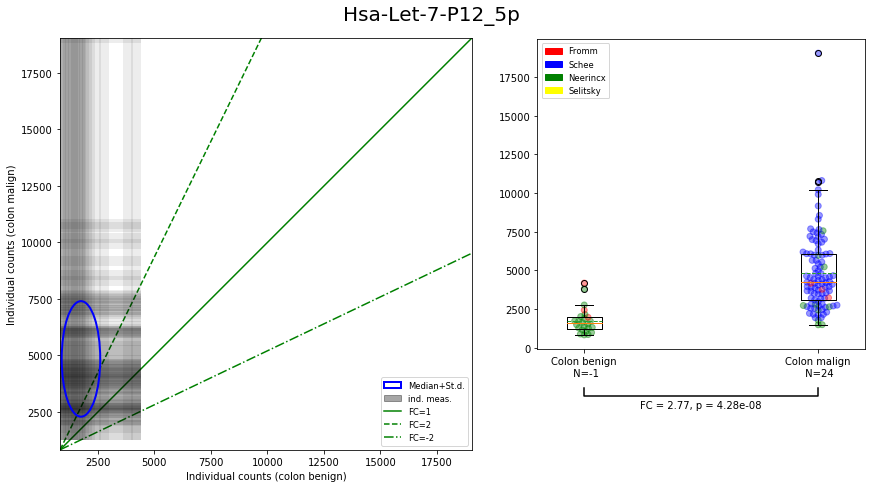

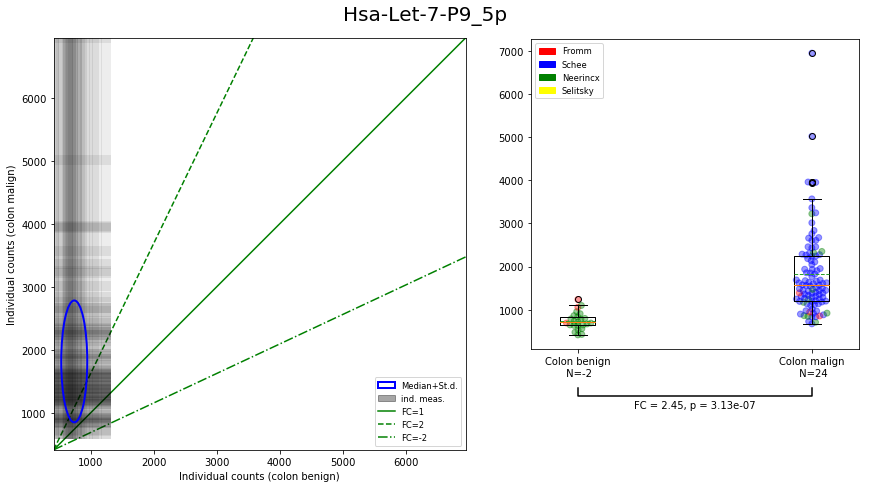

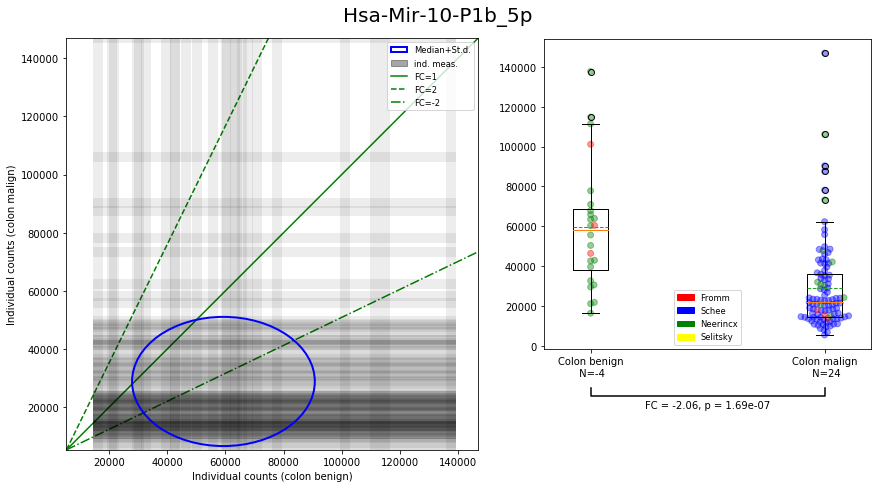

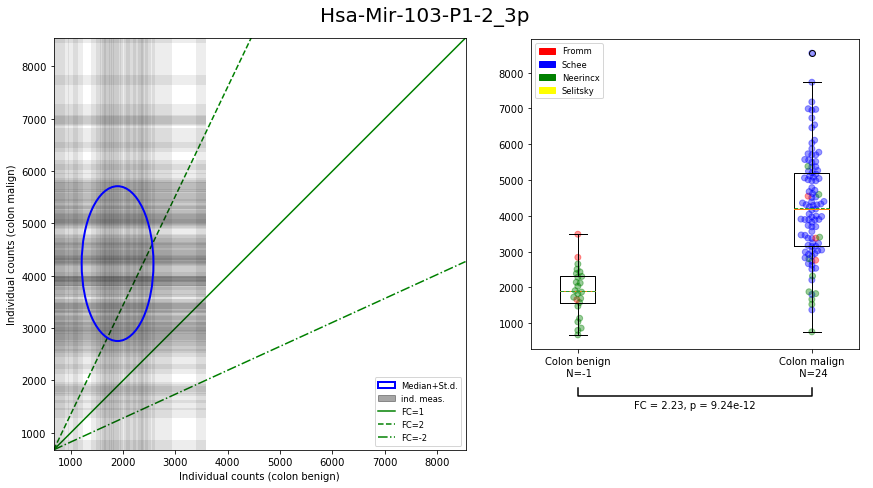

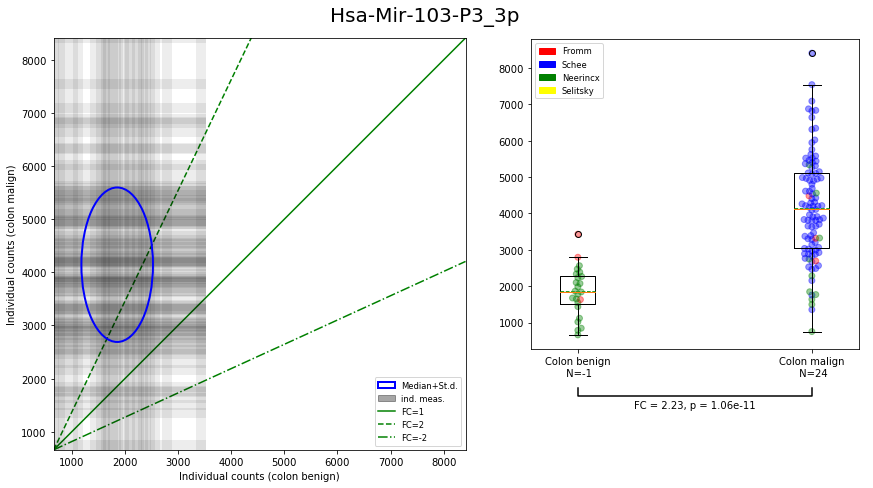

...

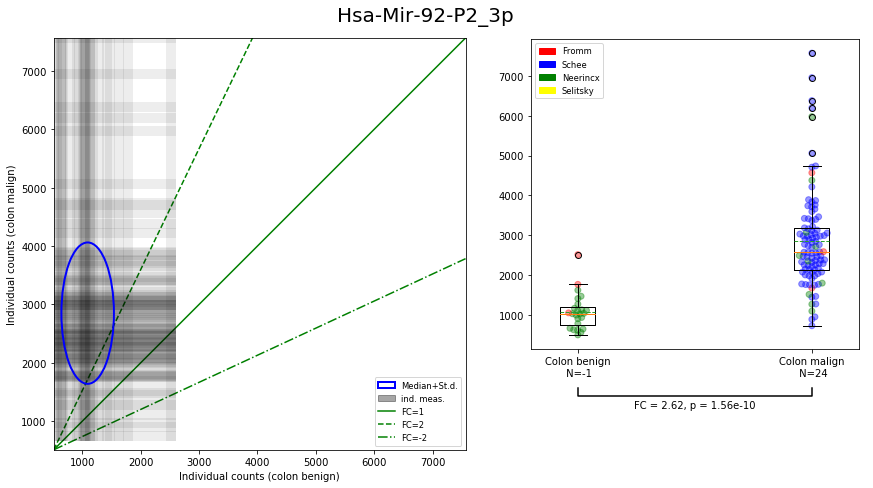

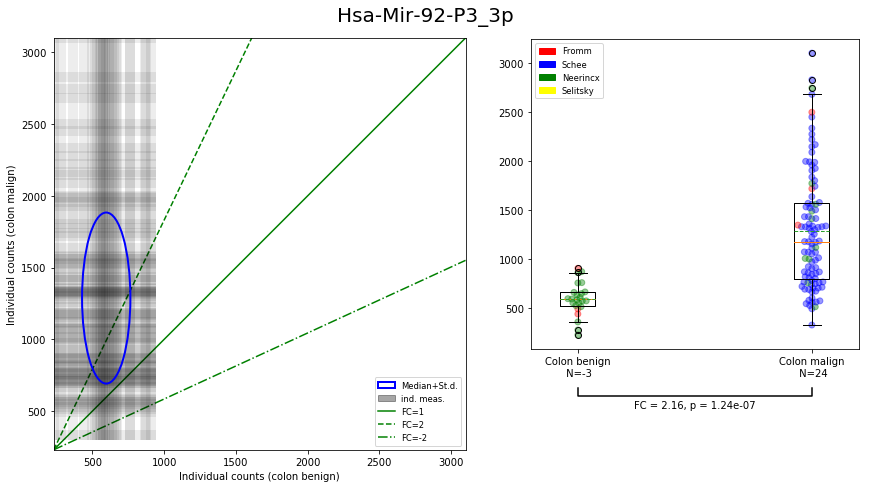

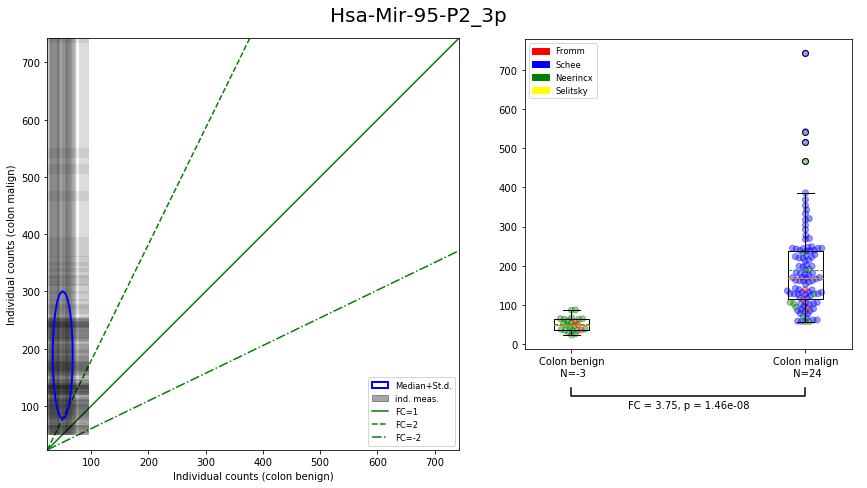

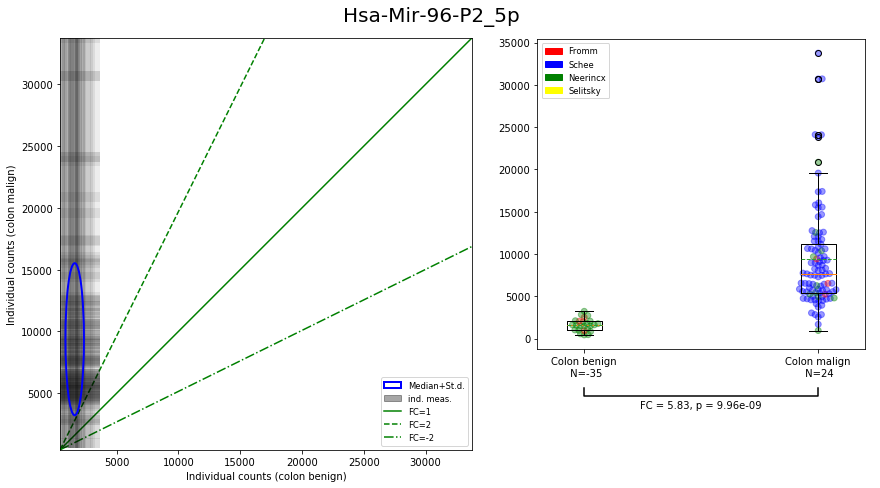

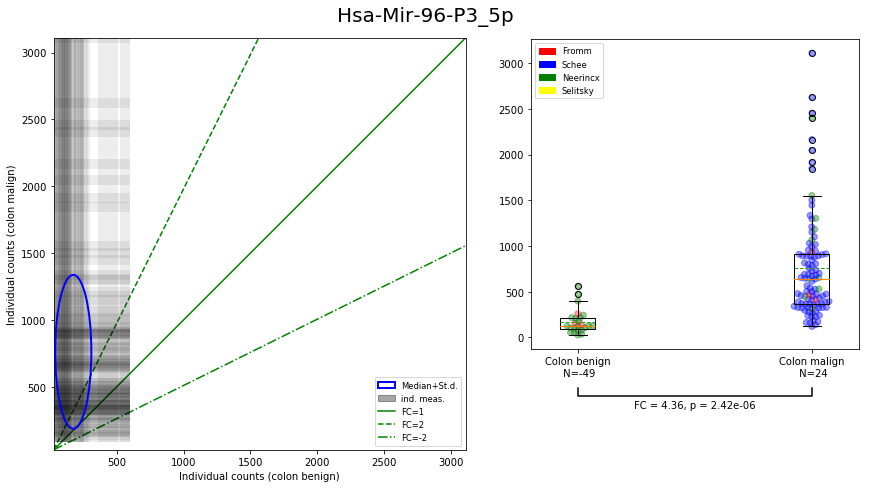

In [8]:
for item in list(mirnalist.query(query1).index):
    combplotcol(item)


Now we are interested in the miRNA where both ellipses are different sides of the FC=1 straight green line, i.e. where the liver malign-colon malign ratio and the liver benign-colon malign ratio are both larger than 1 or both smaller than -1. In order to exclude cases that center around FC=1, higher cutoffs of 1.5 and -1.5, respectively, have been chosen.

As an additional filter, first come the ones where the change of colon malign to liver malign follow the same trend as liver benign to liver malign.

In [9]:
fco=1.5 #cutoff
query2='total_counts > 400 and tissue_mirna==False and ((fc_lm_cm < %f and fc_lb_cb > 1) or (fc_lm_cm > %f and fc_lb_cb < -1) or (fc_lm_cm < -1 and fc_lb_cb > %f) or (fc_lm_cm > 1 and fc_lb_cb < %f)) and fc_lm_cm*fc_lb_lm>0' % (-fco,fco,fco,-fco)
mirnalist.query(query2)

,p_cm_cb,p_cm_lm,p_cb_lb,p_lm_lb,fc_cm_cb,fc_lm_cm,fc_lb_cb,fc_lb_lm,N_cb,N_cm,N_lb,N_lm,total_counts,tissue_mirna
Hsa-Mir-103-P1-2_3p,9.244116e-12,0.116527,4.348665e-08,0.481822,2.232835,-1.155588,1.810368,-1.067277,24,101,24,19,13225.097042,False
Hsa-Mir-103-P3_3p,1.060049e-11,0.102521,1.784214e-07,0.325442,2.233893,-1.163499,1.751143,-1.096390,24,101,24,19,12807.600724,False
Hsa-Mir-19-P1_3p,4.418713e-13,0.731784,2.403434e-03,0.000907,5.157602,-1.046291,2.105632,-2.340982,24,101,24,19,1008.450246,False
Hsa-Mir-192-P2_5p,1.237927e-19,0.015509,2.809846e-06,0.305364,-2.626522,1.343741,-1.765132,1.107368,24,101,24,19,178860.775452,False
Hsa-Mir-214_3p,2.029039e-05,0.915933,1.038462e-04,0.690395,1.990722,-1.015026,1.827285,-1.073292,24,101,24,19,510.046670,False
Hsa-Mir-31_5p,1.439426e-02,0.053782,2.005683e-01,0.020324,111.855620,-8.027668,1.330055,-10.474140,24,101,24,19,546.766822,False
Hsa-Mir-374-P1_3p,1.457710e-11,0.075960,1.371234e-04,0.449178,2.380562,-1.202316,1.773998,-1.116086,24,101,24,19,726.136701,False


Now all these are plotted:

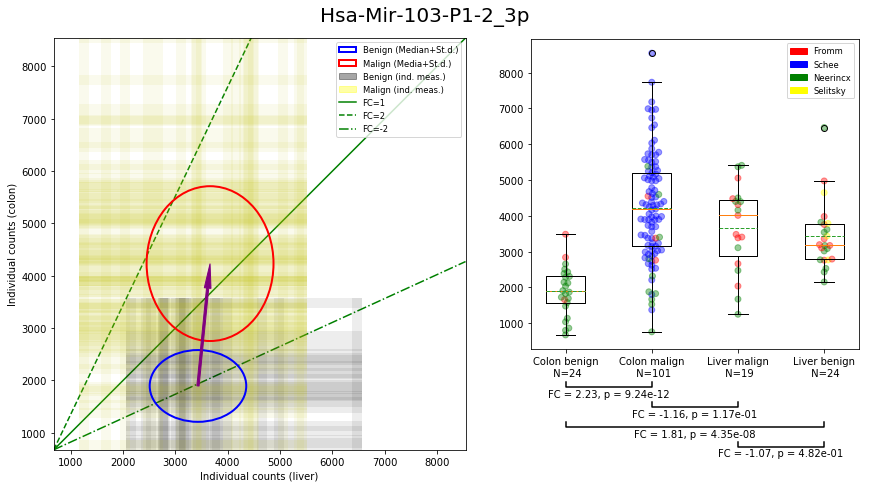

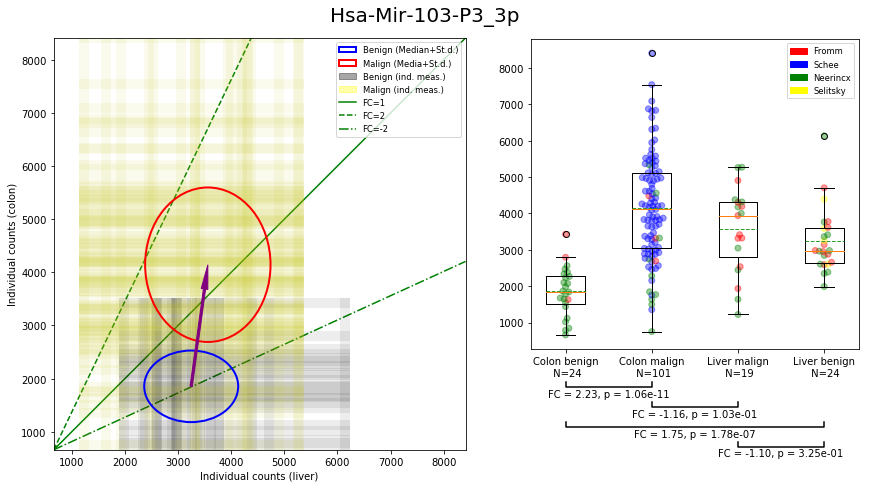

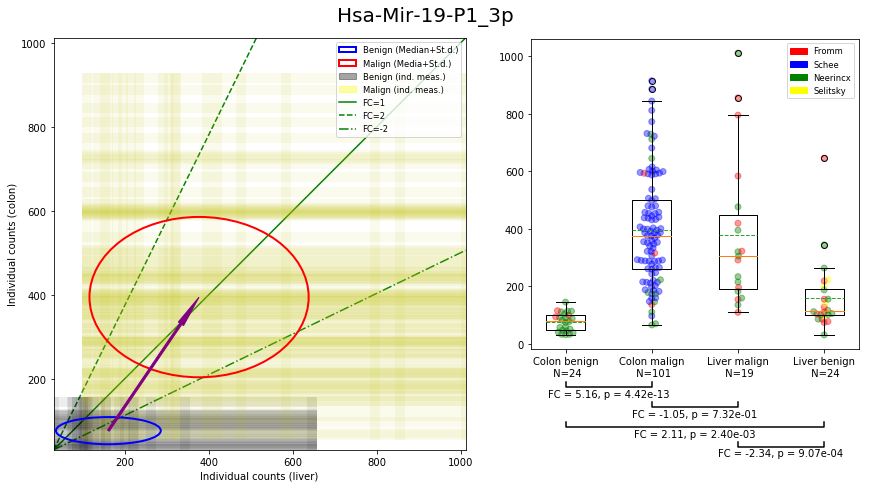

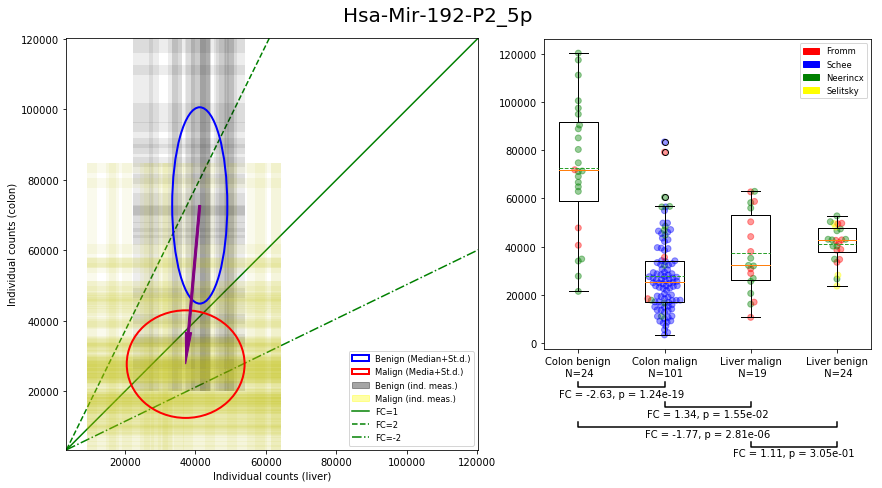

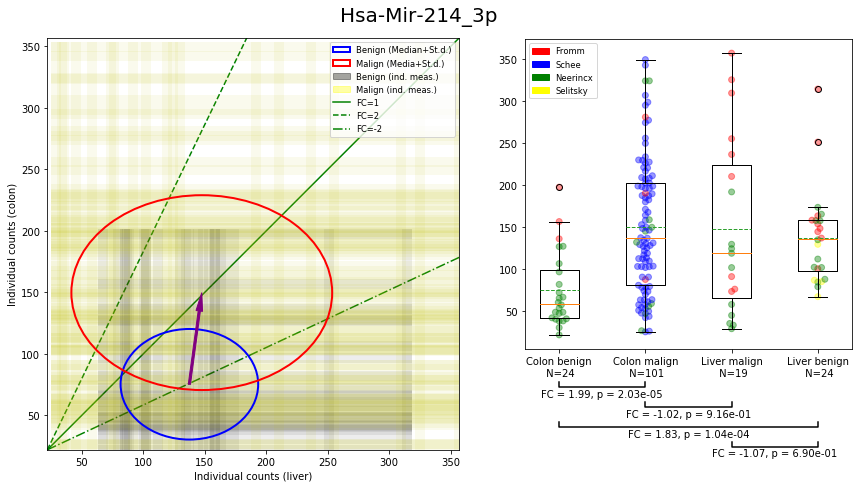

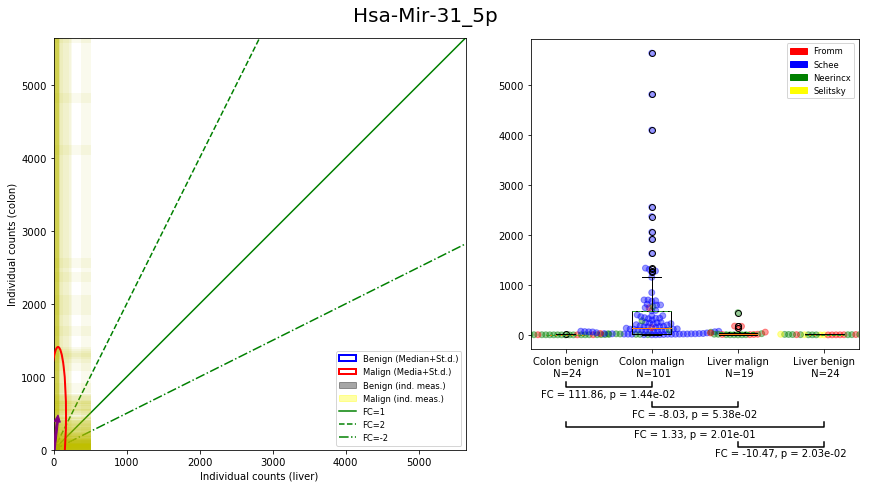

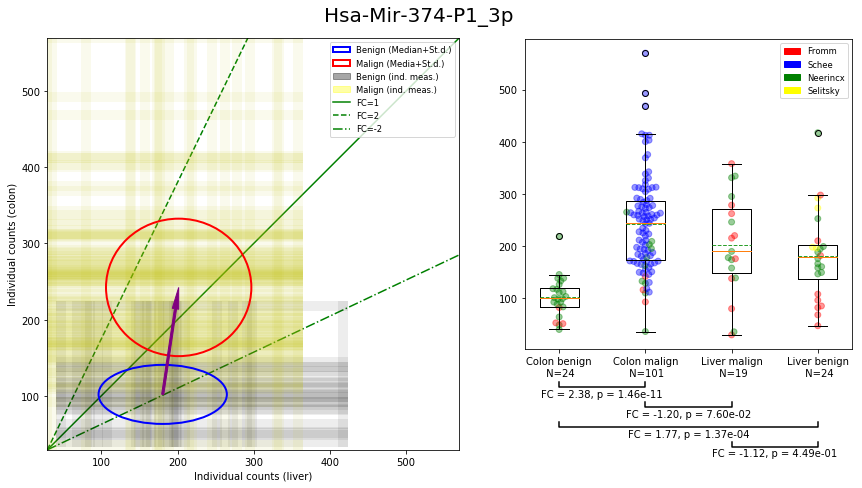

In [10]:
for item in list(mirnalist.query(query2).index):
    combplot(item)

Now come the ones where the change of colon malign to liver malign do not follow the same trend as liver benign to liver malign.

In [11]:
fco=1.5 #cutoff
query12='total_counts > 400 and tissue_mirna==False and ((fc_lm_cm < %f and fc_lb_cb > 1) or (fc_lm_cm > %f and fc_lb_cb < -1) or (fc_lm_cm < -1 and fc_lb_cb > %f) or (fc_lm_cm > 1 and fc_lb_cb < %f)) and fc_lm_cm*fc_lb_lm<0' % (-fco,fco,fco,-fco)
mirnalist.query(query12)

,p_cm_cb,p_cm_lm,p_cb_lb,p_lm_lb,fc_cm_cb,fc_lm_cm,fc_lb_cb,fc_lb_lm,N_cb,N_cm,N_lb,N_lm,total_counts,tissue_mirna
Hsa-Mir-10-P1a_5p,1.123321e-01,3.522856e-04,1.377377e-08,1.439242e-06,1.287759,1.715797,-2.583571,-5.708308,24,101,24,19,320447.827049,False
Hsa-Mir-10-P2a_5p,7.346946e-02,1.971320e-01,1.423196e-07,1.653406e-05,1.909509,-1.626276,2.706157,2.304796,24,101,24,19,5056.673341,False
Hsa-Mir-10-P2b_5p,2.364094e-01,9.676175e-01,4.416225e-18,6.562690e-15,1.260039,-1.008161,11.021630,8.818529,24,101,24,19,1198.984170,False
Hsa-Mir-10-P2c_5p,5.423693e-02,5.658453e-01,6.317651e-03,6.301471e-02,-1.364121,1.114067,-1.791083,-1.462747,24,101,24,19,5997.977207,False
Hsa-Mir-130-P1a_3p,2.119808e-02,7.711577e-01,1.351304e-11,1.018979e-06,1.260758,-1.033152,2.543930,2.084694,24,101,24,19,1674.359571,False
Hsa-Mir-1307_5p,3.786464e-03,8.687033e-04,8.050305e-02,3.167021e-02,-1.547311,1.698105,-1.409428,-1.546759,24,101,24,19,1837.650765,False
Hsa-Mir-1307_3p,2.720807e-01,2.861507e-02,4.260915e-03,2.904797e-04,1.131723,1.303514,-1.504429,-2.219344,24,101,24,19,408.799052,False
Hsa-Mir-146-P2_5p,1.289717e-02,1.383255e-02,4.311337e-01,2.437215e-01,2.192985,-2.515165,1.225983,1.406132,24,101,24,19,13493.836423,False
Hsa-Mir-181-P2c_5p,1.361029e-09,1.451820e-01,4.568812e-07,2.835075e-09,4.300938,1.217964,-1.939446,-10.158735,24,101,24,19,425.058685,False
Hsa-Mir-192-P1_5p,3.451970e-08,1.915282e-01,6.666351e-05,4.444130e-01,-1.629050,1.145835,-1.536309,-1.080590,24,101,24,19,640180.597836,False


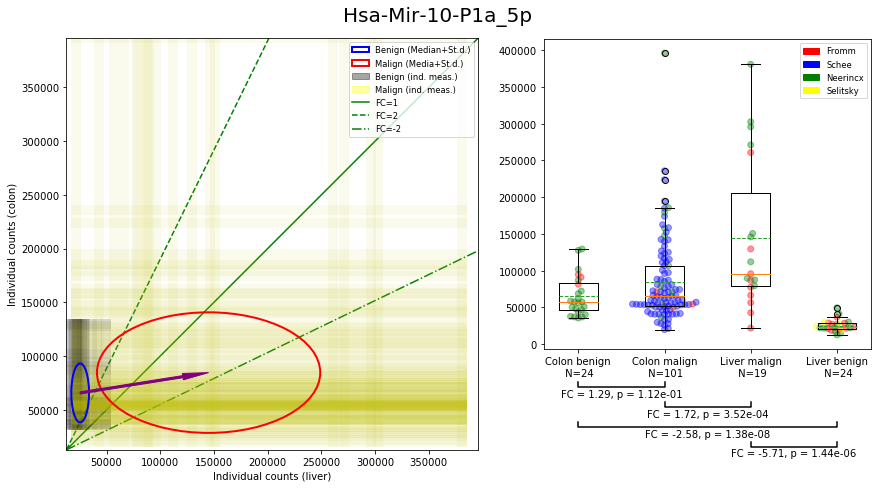

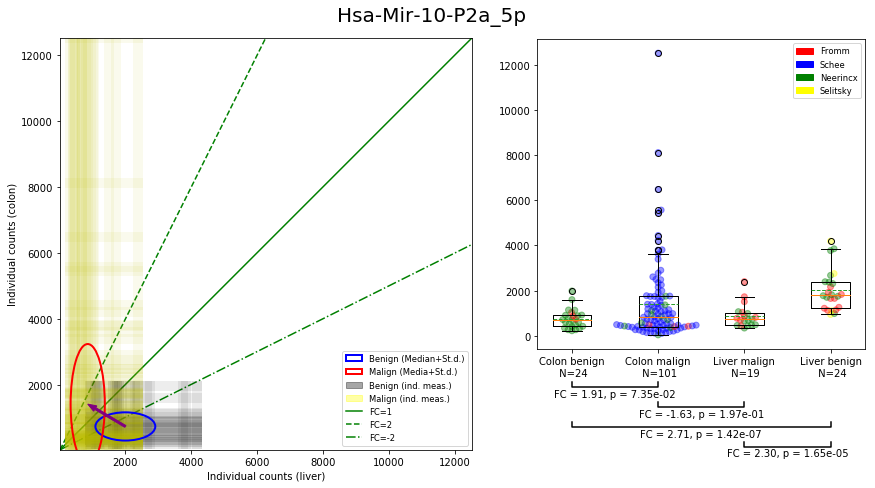

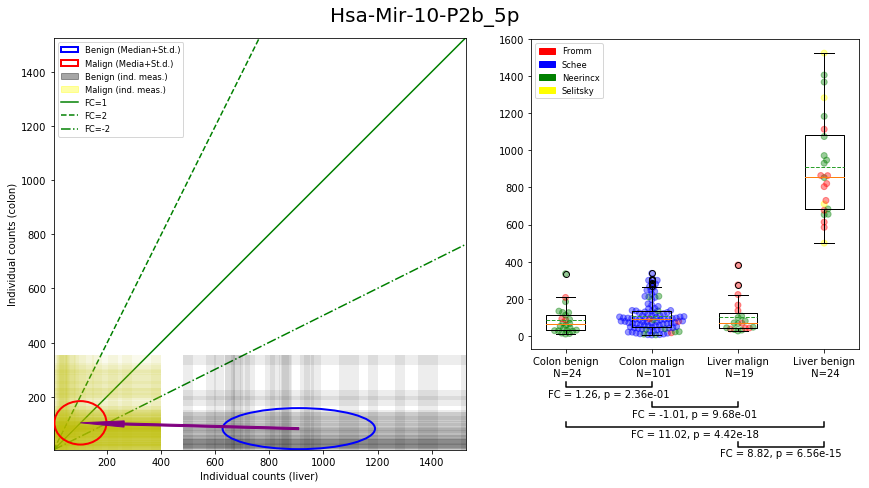

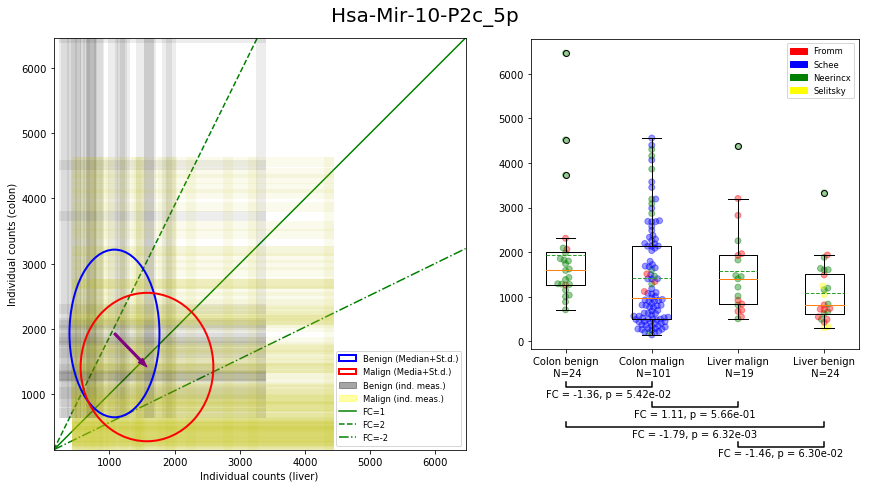

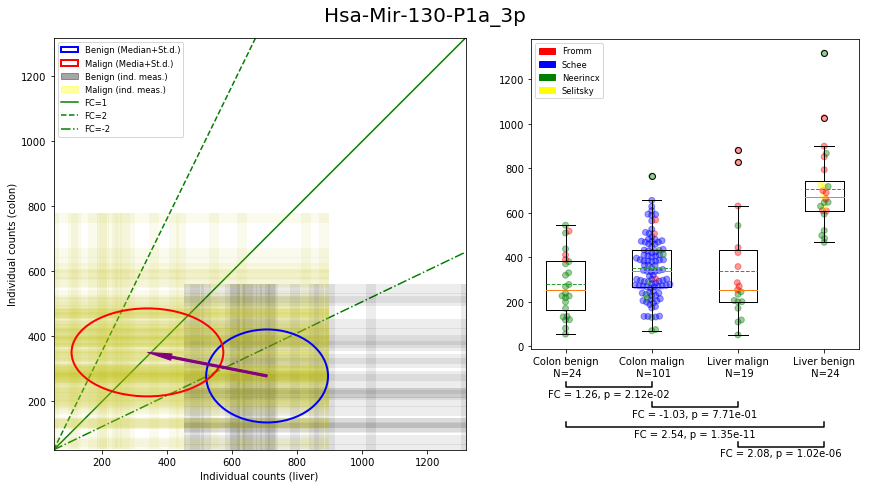

...

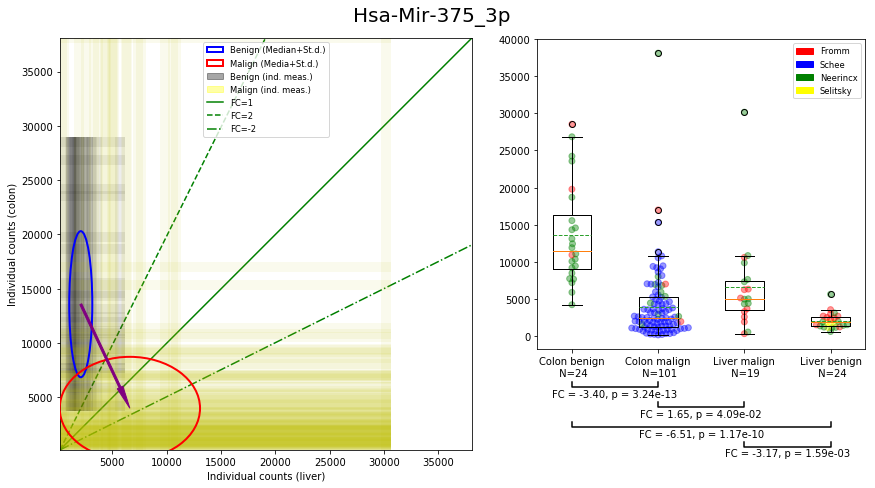

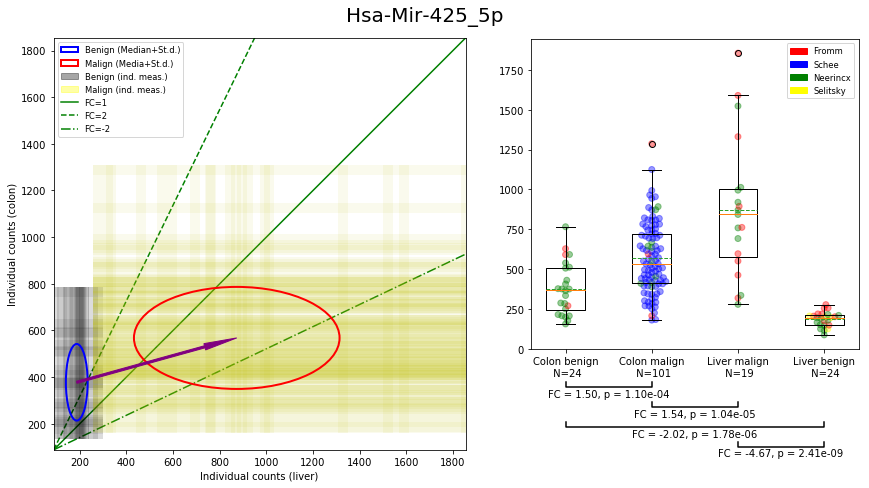

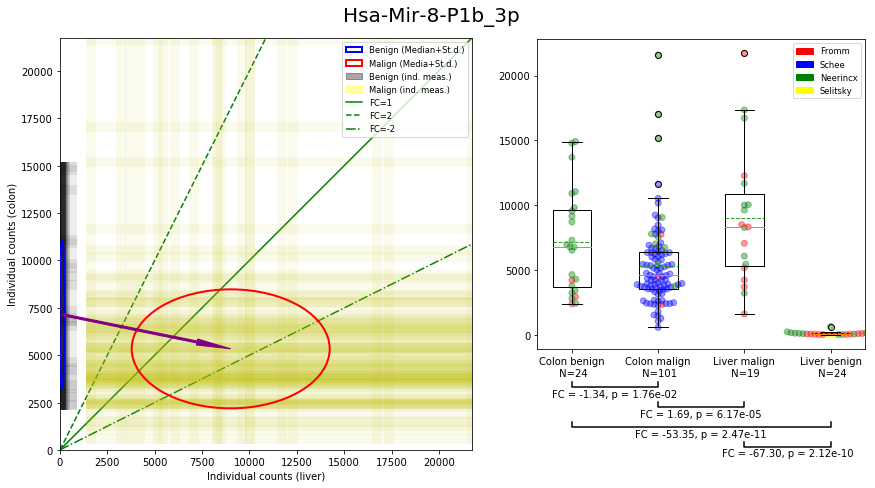

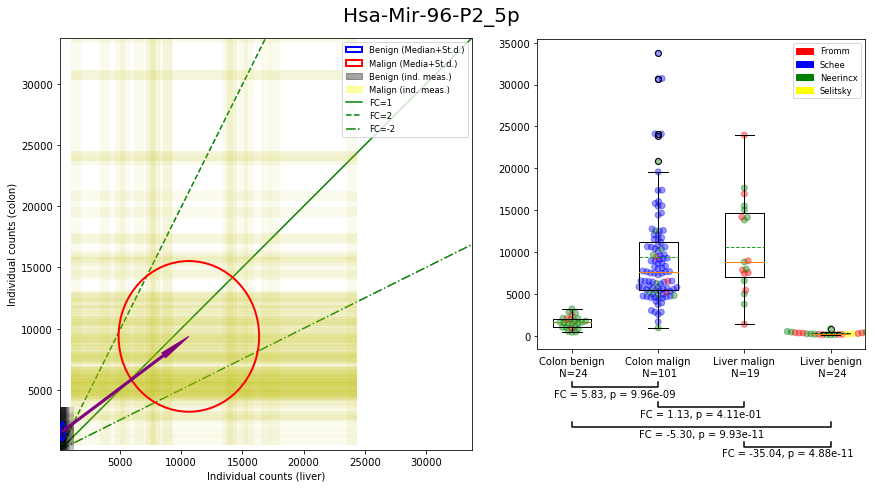

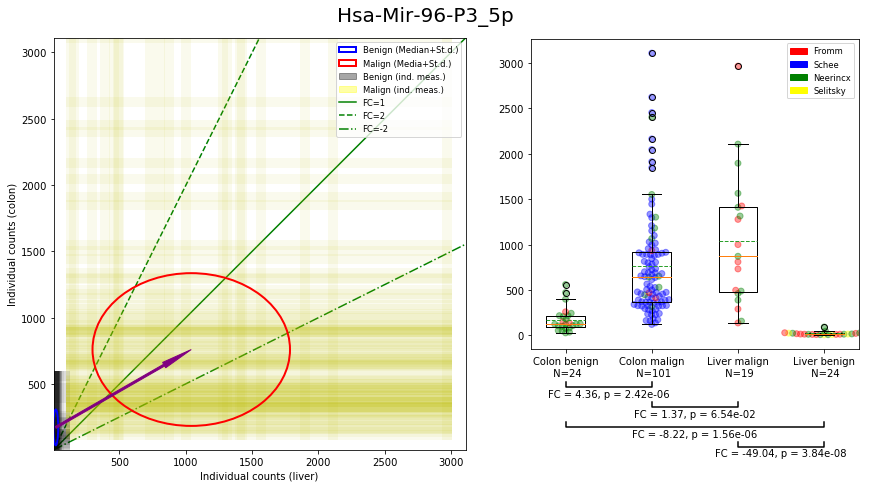

In [12]:
for item in list(mirnalist.query(query12).index):
    combplot(item)

Now the ones where the ellipses are on the same side, i.e. the selected miRNA is expressed stronger in one specific tissue, regardless of malign or benign. Additionally, the relative change of liver expression should go in the opposite direction such that liver remnants alone cannot be the reason for the observed changes.

In [13]:
fco=1.5 #cutoff value
query3='total_counts > 400 and tissue_mirna==0 and ((fc_lm_cm > %f and fc_lb_cb > 1 and fc_lb_lm > 1) or (fc_lm_cm < %f and fc_lb_cb < -1 and fc_lb_lm < 1) or (fc_lm_cm > 1 and fc_lb_cb > %f and fc_lb_lm > 1) or (fc_lm_cm < -1 and fc_lb_cb < %f and fc_lb_lm < 1))' % (fco,-fco,fco,-fco)
mirnalist.query(query3)

,p_cm_cb,p_cm_lm,p_cb_lb,p_lm_lb,fc_cm_cb,fc_lm_cm,fc_lb_cb,fc_lb_lm,N_cb,N_cm,N_lb,N_lm,total_counts,tissue_mirna
Hsa-Let-7-P12_5p,4.278984e-08,9.754251e-05,2.463661e-01,3.992346e-03,2.771537,-2.005364,-1.167641,-1.613713,24,101,24,19,10510.605628,False
Hsa-Mir-10-P1b_5p,1.686720e-07,1.056620e-03,1.528002e-11,4.396471e-03,-2.055630,-2.603610,-25.824510,-4.825943,24,101,24,19,101592.283526,False
Hsa-Mir-10-P3a_5p,1.952070e-04,1.203257e-04,2.985387e-01,7.750291e-01,-1.638494,1.843955,1.196116,1.062857,24,101,24,19,7152.232348,False
Hsa-Mir-10-P3b-c_5p,2.163696e-02,1.577741e-05,4.070701e-10,4.395448e-07,-1.472144,2.111113,4.664502,3.252749,24,101,24,19,4392.318023,False
Hsa-Mir-101-P1-2_3p,9.622964e-03,8.965294e-01,3.370908e-09,5.898246e-07,1.225938,1.010537,3.905932,3.152855,24,101,24,19,23376.515988,False
Hsa-Mir-130-P4a_3p,8.640889e-08,4.338700e-02,7.069612e-04,1.805019e-07,1.764204,-1.217227,-1.549175,-2.245275,24,101,24,19,415.564935,False
Hsa-Mir-132-P1_3p,4.935832e-04,1.277487e-01,4.443287e-03,1.947944e-04,1.634114,-1.235482,-1.827610,-2.417251,24,101,24,19,408.878213,False
Hsa-Mir-133-P1-2_3p,3.328335e-06,2.296974e-02,1.253967e-03,9.973500e-04,-3.559779,-2.431852,-21.211396,-2.450556,24,101,24,19,543.051445,False
Hsa-Mir-133-P3_3p,3.417998e-06,2.256880e-02,1.284160e-03,1.128420e-03,-3.567060,-2.448525,-21.325184,-2.441933,24,101,24,19,529.389798,False
Hsa-Mir-148-P1_3p,1.153669e-03,7.680352e-01,7.866799e-16,9.428689e-10,1.627490,1.042447,5.175744,3.050705,24,101,24,19,164524.404618,False


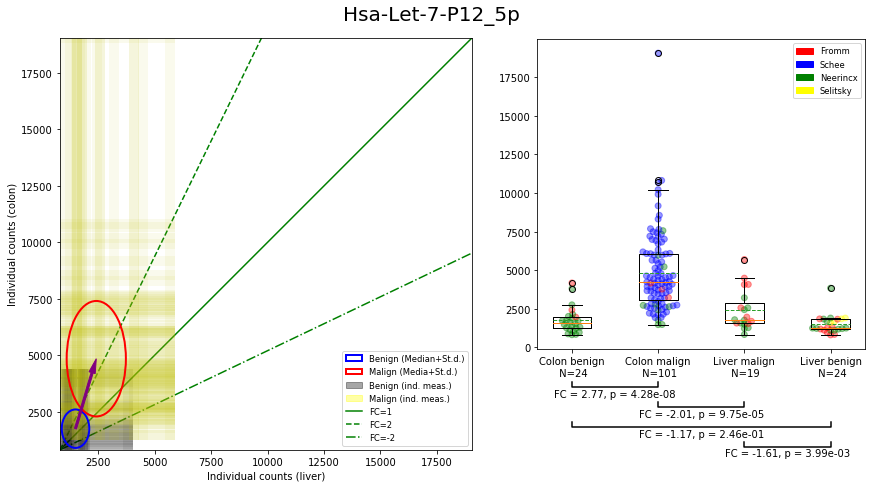

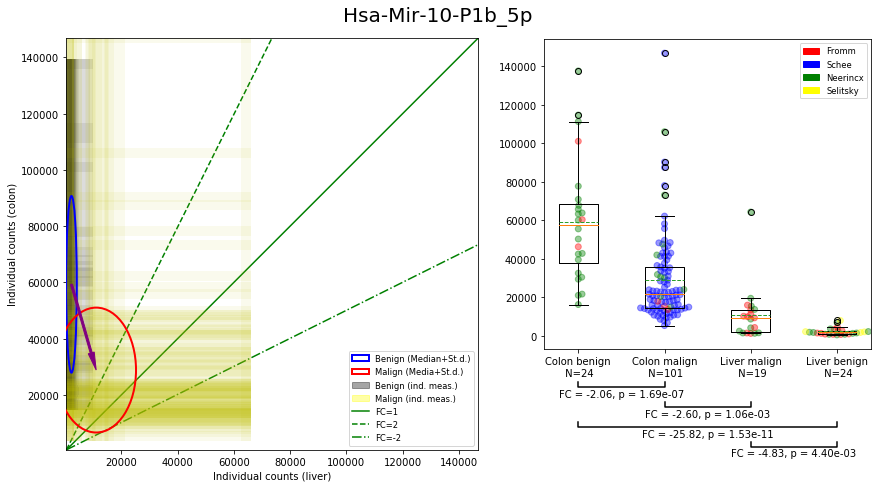

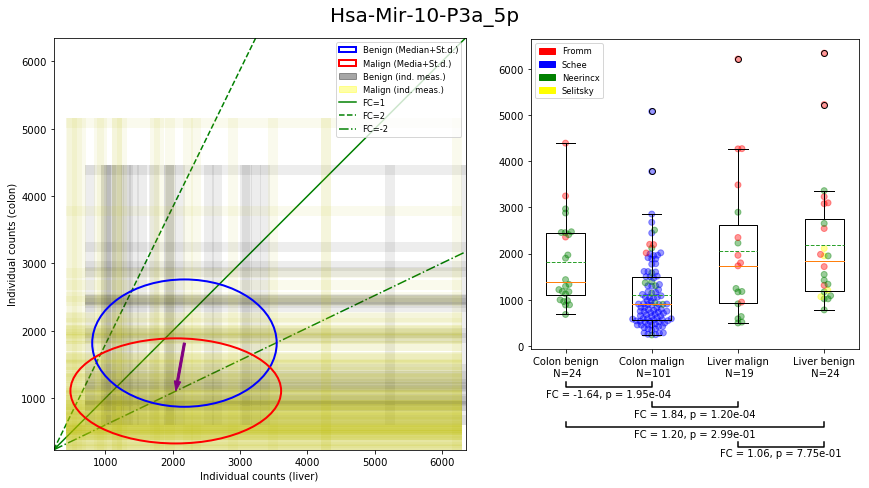

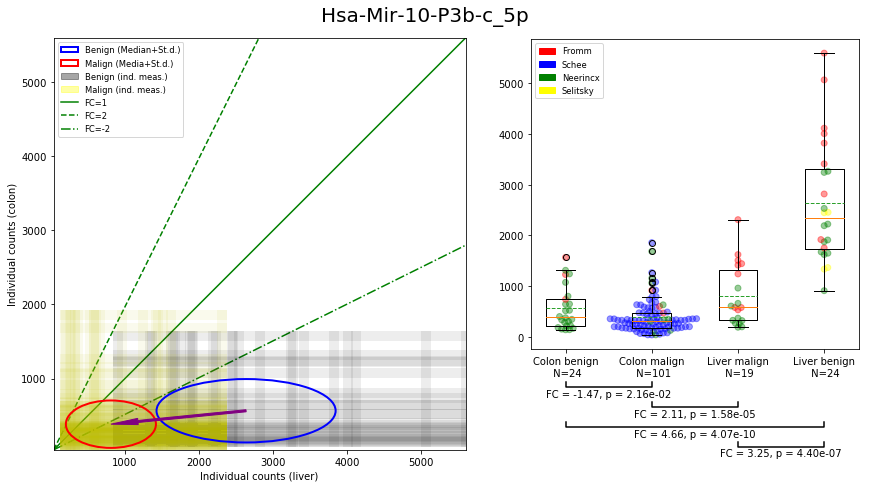

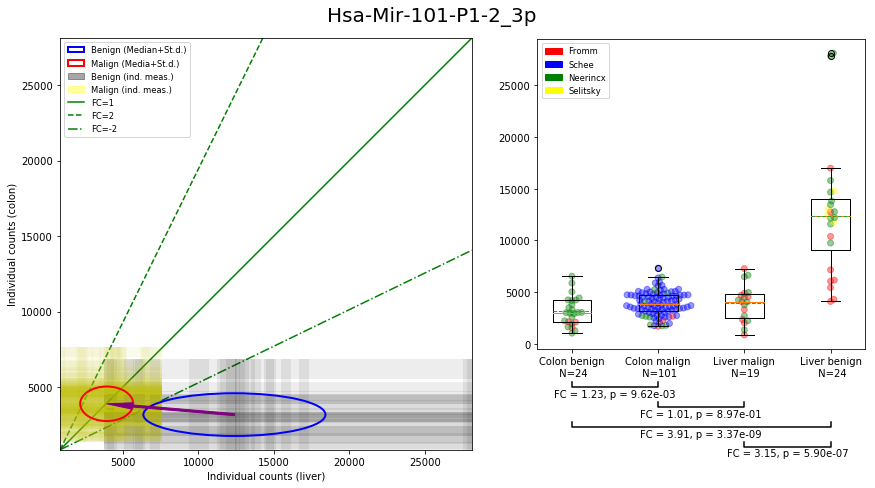

...

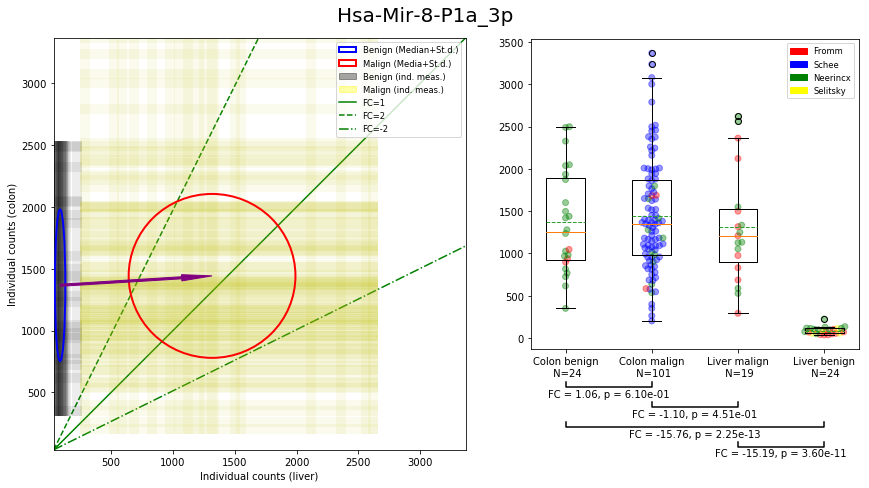

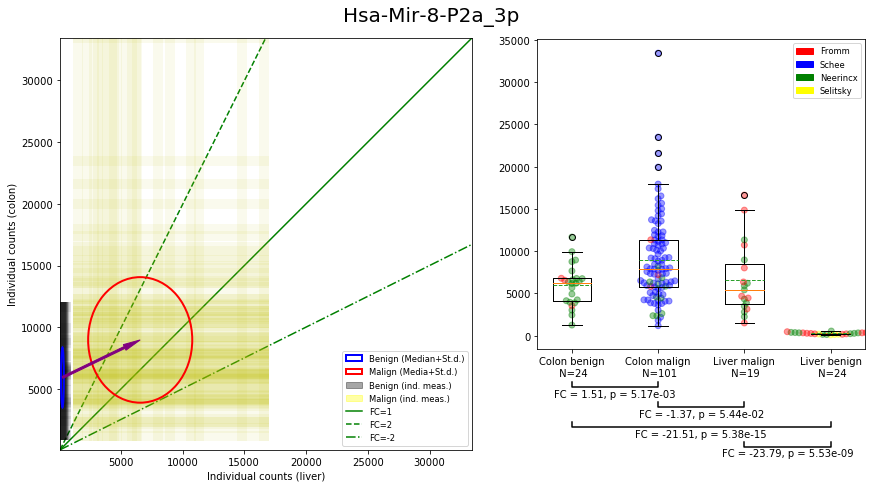

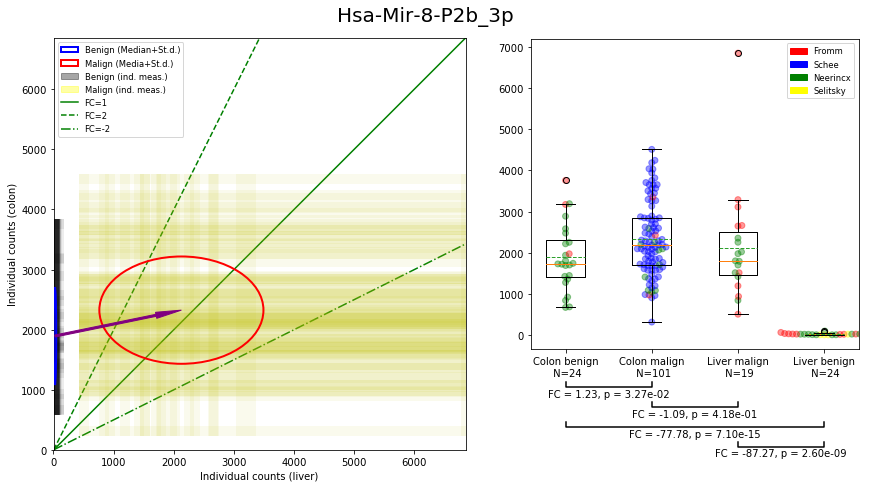

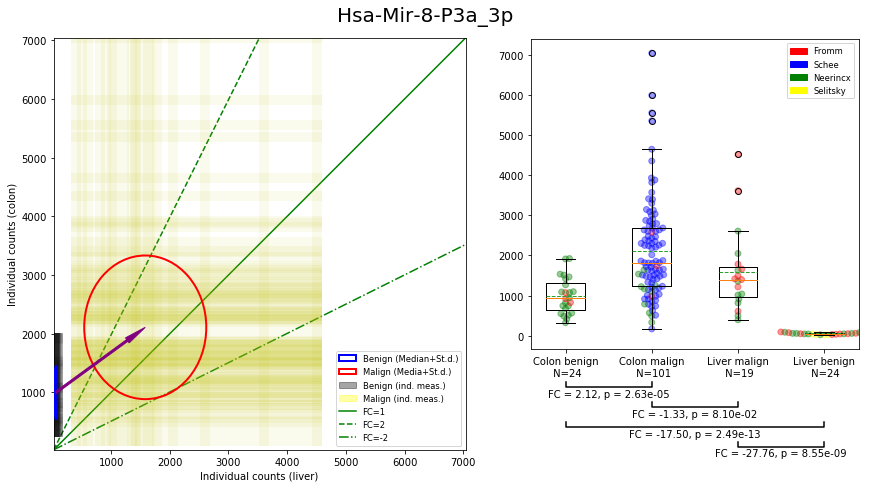

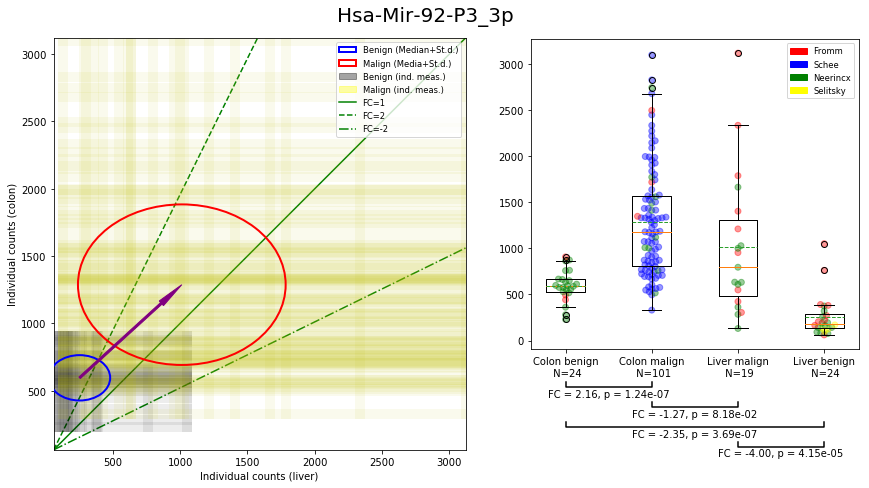

In [14]:
for item in list(mirnalist.query(query3).index):
    combplot(item)

Now come the ones, where the relative change in miRNA expression in liver tissue has the same trend and could be the reason for the observed shift in expression.

In [15]:
fco=1.5 #cutoff value
query4='total_counts > 400 and tissue_mirna==False and ((fc_lm_cm > %f and fc_lb_cb > 1 and fc_lb_lm < 1) or (fc_lm_cm < %f and fc_lb_cb < -1 and fc_lb_lm > 1) or (fc_lm_cm > 1 and fc_lb_cb > %f and fc_lb_lm < 1) or (fc_lm_cm < -1 and fc_lb_cb < %f and fc_lb_lm > 1))' % (fco,-fco,fco,-fco)
mirnalist.query(query4)

,p_cm_cb,p_cm_lm,p_cb_lb,p_lm_lb,fc_cm_cb,fc_lm_cm,fc_lb_cb,fc_lb_lm,N_cb,N_cm,N_lb,N_lm,total_counts,tissue_mirna
Hsa-Mir-1247_5p,9.335052e-03,1.395349e-02,6.485372e-02,0.000592,4.383886,1.948639,1.803901,-4.735408,24,101,24,19,422.222374,False
Hsa-Mir-128-P1-2_3p,1.005155e-07,5.518567e-01,2.189641e-03,0.041015,2.420503,1.080901,1.713078,-1.527242,24,101,24,19,632.796052,False
Hsa-Mir-146-P1_5p,1.798215e-02,1.139204e-03,4.479669e-02,0.714692,1.941192,-3.939324,-1.791190,1.132976,24,101,24,19,3693.884900,False
Hsa-Mir-15-P1d_5p,5.777811e-08,2.363036e-01,5.517137e-07,0.647812,7.559291,1.368139,8.352805,-1.238151,24,101,24,19,802.596921,False
Hsa-Mir-15-P2a_5p,1.818566e-05,4.566836e-07,8.419748e-01,0.489214,-1.541728,1.699843,1.022415,-1.078357,24,101,24,19,19836.324761,False
Hsa-Mir-15-P2b_5p,1.835074e-05,4.588182e-07,8.414001e-01,0.488434,-1.541591,1.700067,1.022492,-1.078513,24,101,24,19,19839.665945,False
Hsa-Mir-19-P2a-b_3p,6.405825e-11,2.545342e-01,1.176468e-04,0.000759,3.736285,1.147207,2.251508,-1.903707,24,101,24,19,3828.229142,False
Hsa-Mir-204-P1_5p,8.324290e-01,1.316908e-02,3.419039e-10,0.587860,-1.109424,8.002327,4.409997,-1.635568,24,101,24,19,445.085294,False
Hsa-Mir-28-P2_5p,1.572851e-01,1.597634e-03,2.130294e-04,0.692585,1.152443,1.378969,1.512645,-1.050588,24,101,24,19,7734.376074,False
Hsa-Mir-335_5p,1.981514e-07,5.831623e-07,1.048786e-08,0.022623,2.154496,1.801416,2.605036,-1.489840,24,101,24,19,562.974834,False


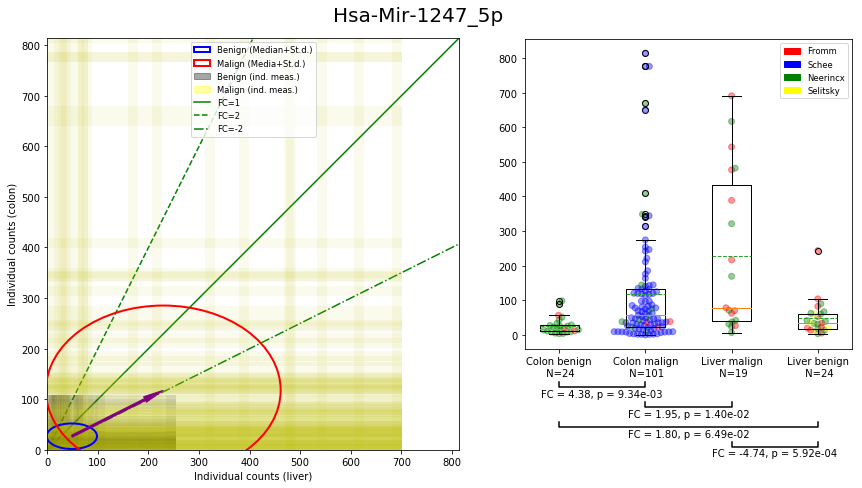

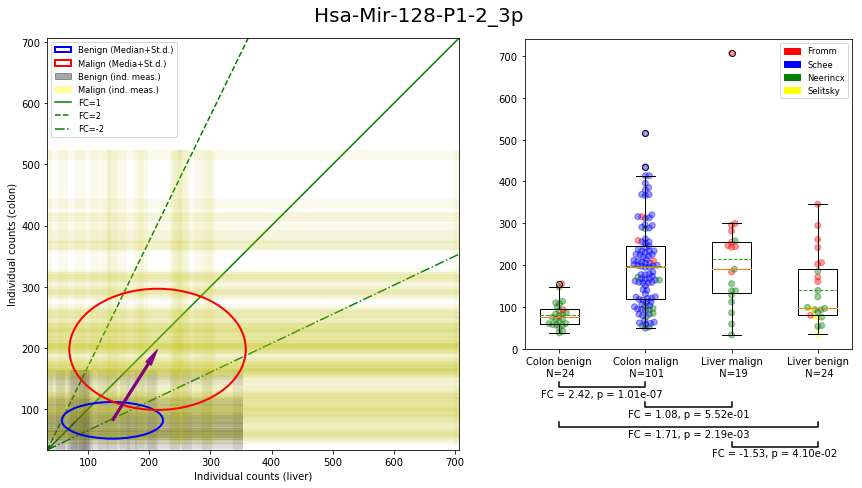

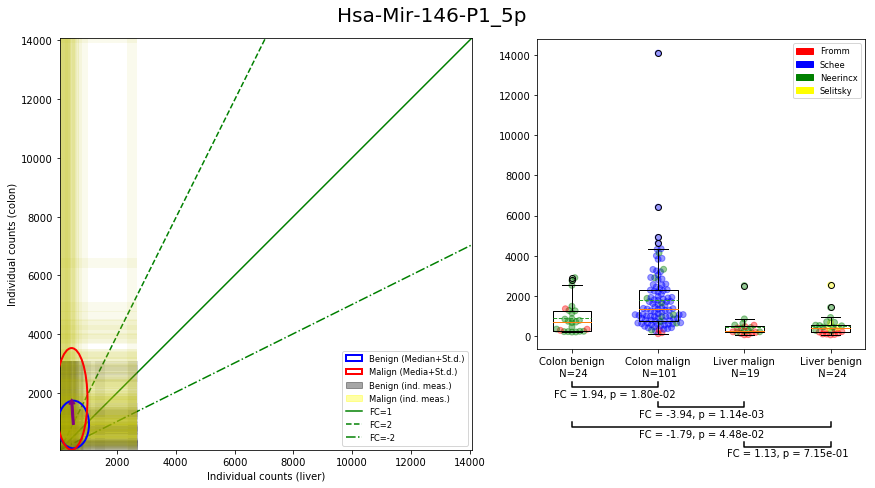

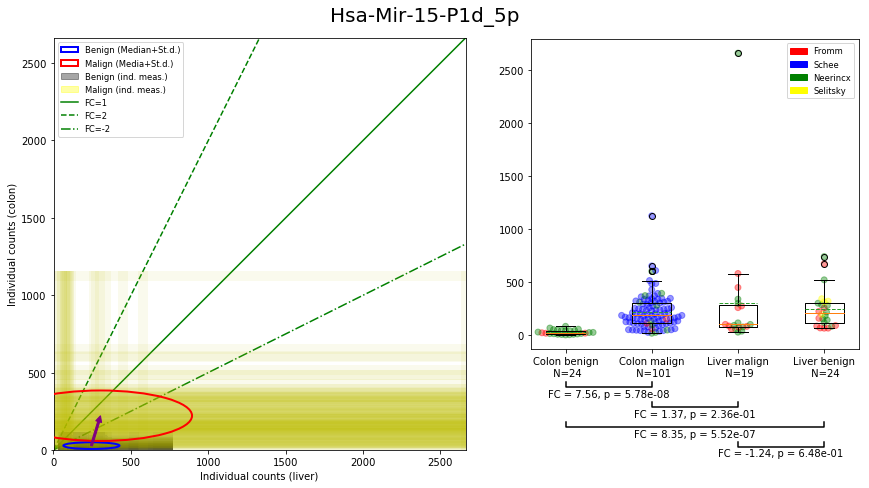

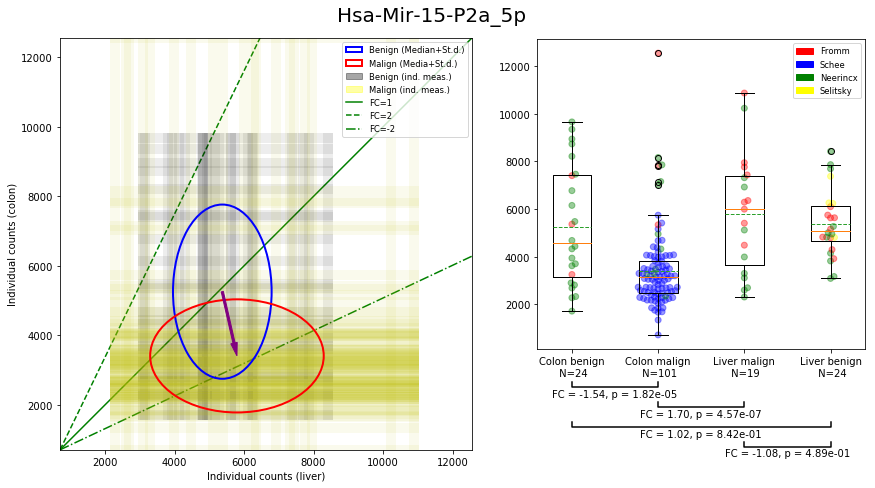

...

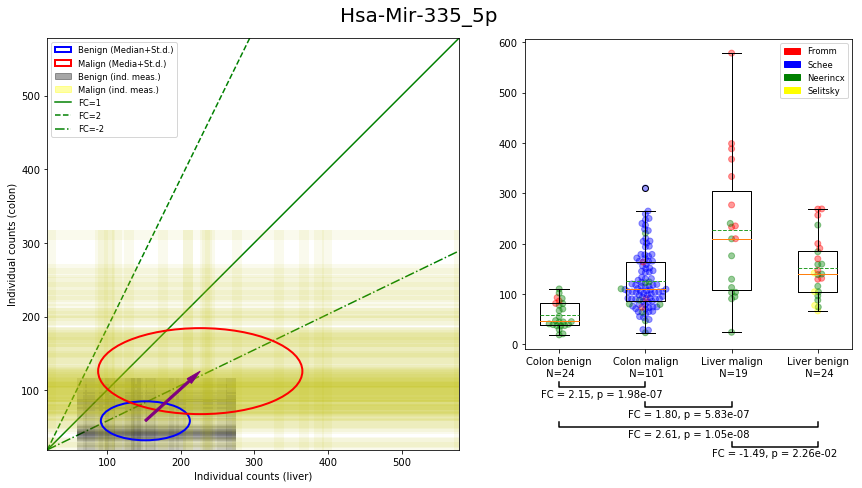

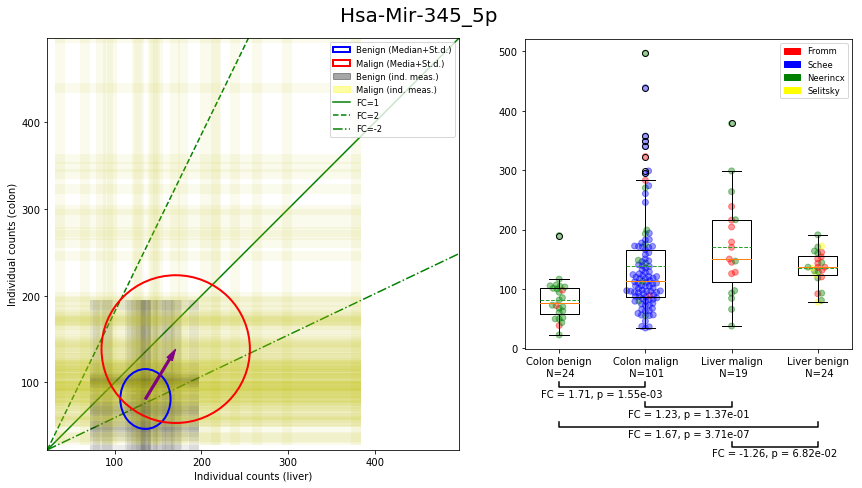

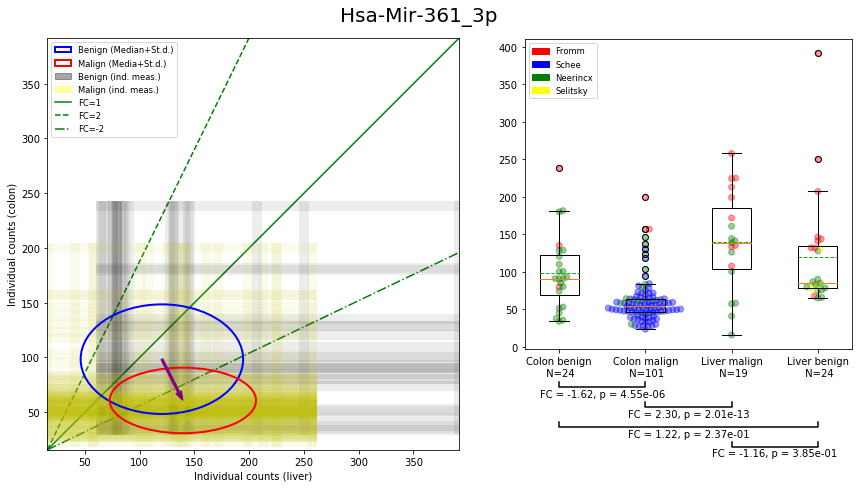

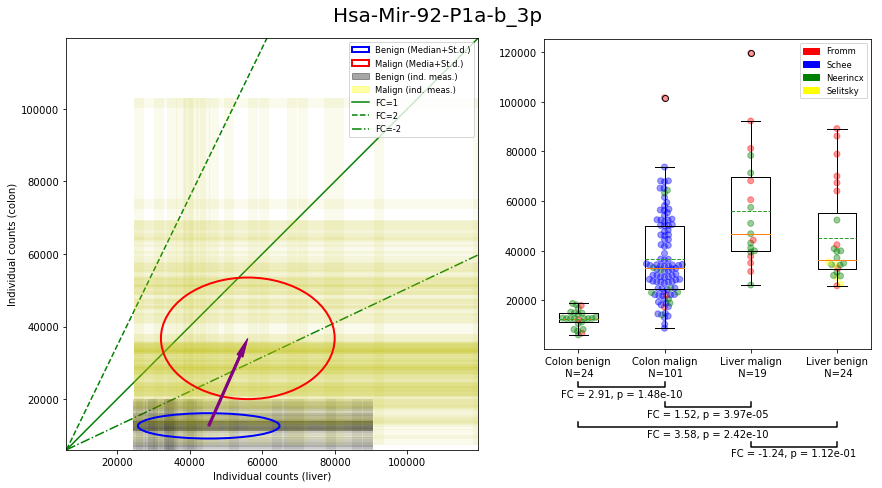

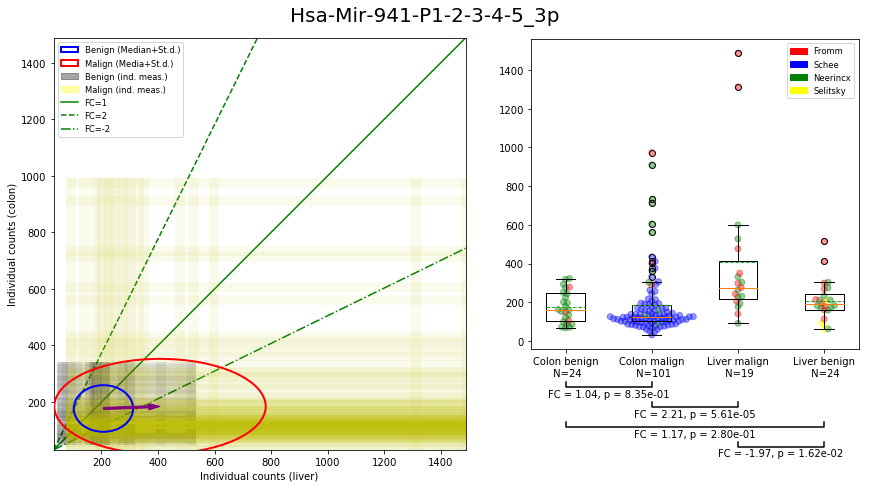

In [16]:
for item in list(mirnalist.query(query4).index):
    combplot(item)

These are the tissue related miRNAs:

In [17]:
query5='tissue_mirna==True'
mirnalist.query(query5)

,p_cm_cb,p_cm_lm,p_cb_lb,p_lm_lb,fc_cm_cb,fc_lm_cm,fc_lb_cb,fc_lb_lm,N_cb,N_cm,N_lb,N_lm,total_counts,tissue_mirna
Hsa-Mir-122_5p,0.227864,4.728730e-07,1.283780e-15,7.696526e-13,-2.290989,243.423080,4146.904083,39.029691,24,101,24,19,140249.292413,True
Hsa-Mir-126_5p,0.464138,9.653319e-01,9.179258e-09,5.261463e-08,-1.098584,1.006320,3.096289,3.380209,24,101,24,19,18095.135373,True
Hsa-Mir-126_3p,0.642972,1.868090e-01,4.680241e-05,4.502764e-05,1.083273,-1.307221,2.788224,3.364683,24,101,24,19,6564.227964,True
Hsa-Mir-142-P1_5p,0.567639,2.155522e-01,5.343311e-01,8.719778e-01,1.077186,-1.224241,-1.098395,1.034709,24,101,24,19,11781.636882,True
Hsa-Mir-143_3p,0.518025,5.420196e-04,6.750566e-05,3.475633e-04,-1.100111,-2.006400,-4.585111,-2.077271,24,101,24,19,480648.499331,True
Hsa-Mir-144_5p,0.966461,4.959433e-02,3.793302e-06,6.752987e-07,1.008751,-1.831029,2.890922,5.247536,24,101,24,19,290.478114,True
Hsa-Mir-144_3p,0.521683,2.106276e-02,5.708755e-03,4.624680e-05,-1.162003,-2.456118,2.194771,6.264142,24,101,24,19,521.348376,True
Hsa-Mir-145_5p,0.000323,7.107014e-01,2.671021e-02,1.845321e-02,-3.062715,-1.076866,-5.946869,-1.803100,24,101,24,19,3959.947096,True
Hsa-Mir-150_5p,0.000119,4.457748e-07,2.771068e-01,7.335270e-01,-2.219040,3.128688,1.645430,1.167057,24,101,24,19,1988.385644,True
Hsa-Mir-223_3p,0.004968,1.786593e-01,3.472559e-03,2.821605e-01,4.245243,-1.704697,1.854494,-1.342817,24,101,24,19,1481.935032,True


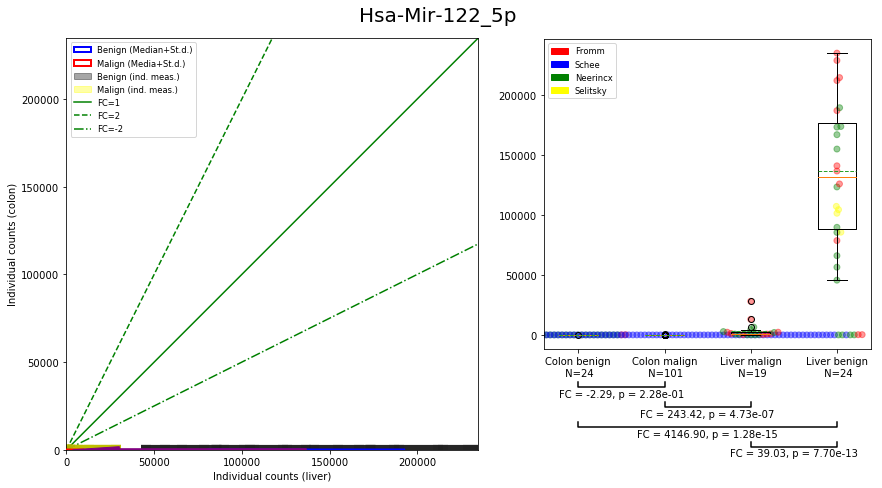

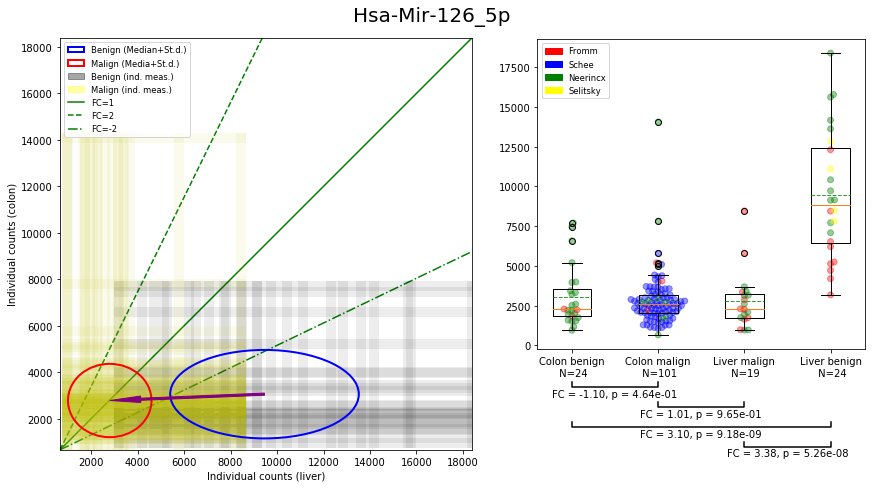

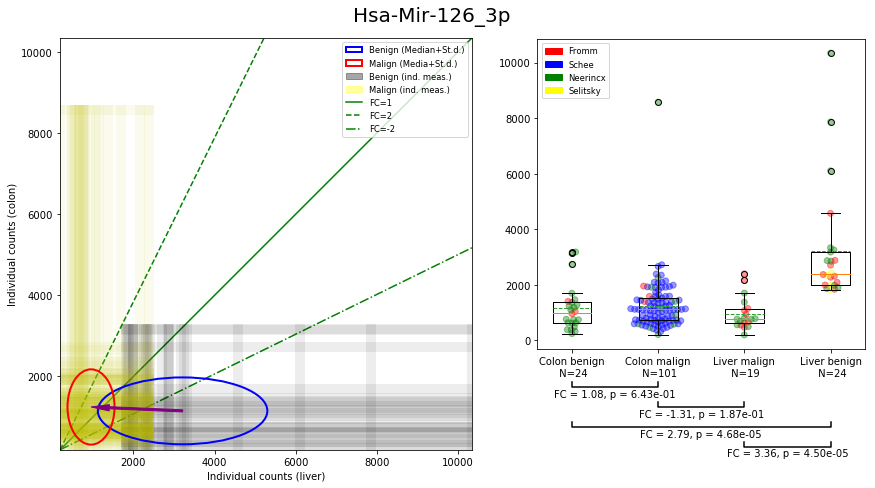

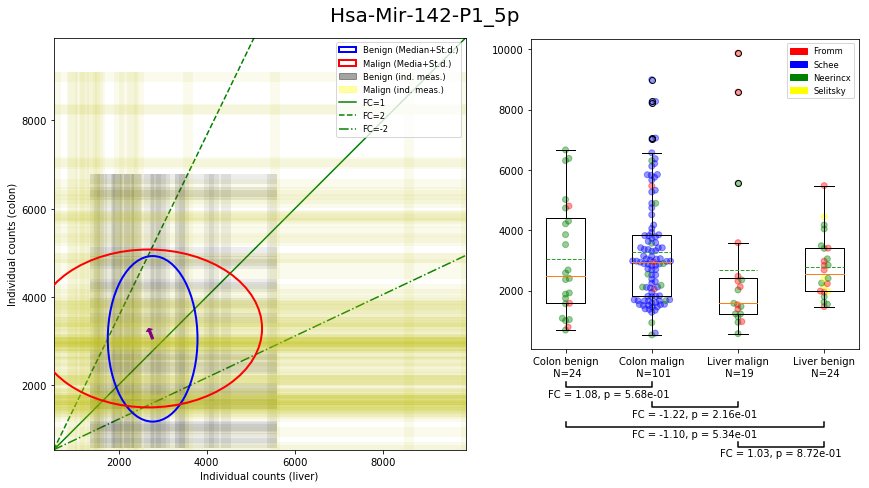

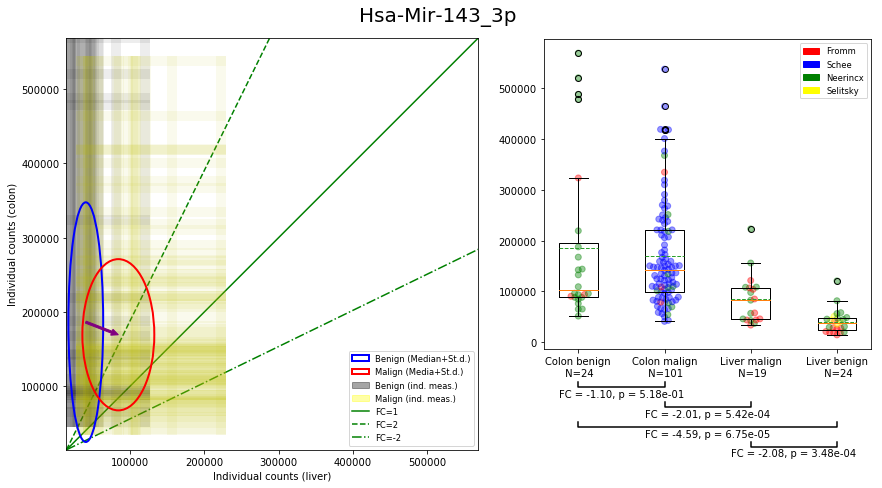

...

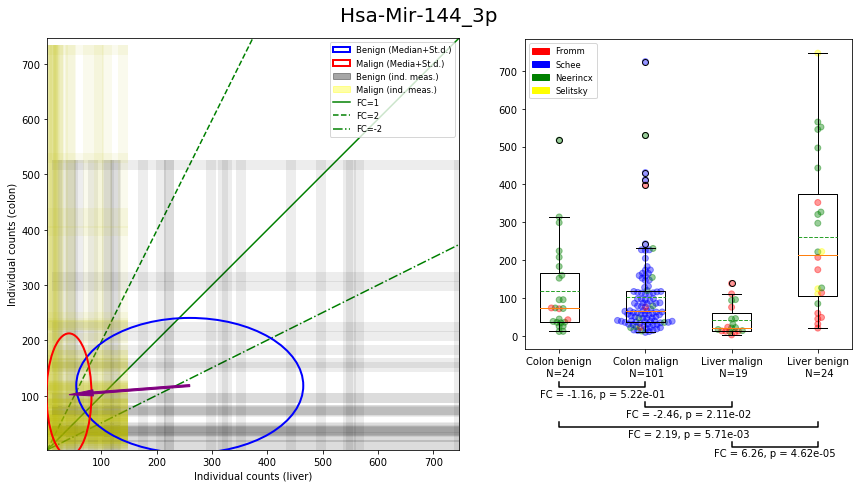

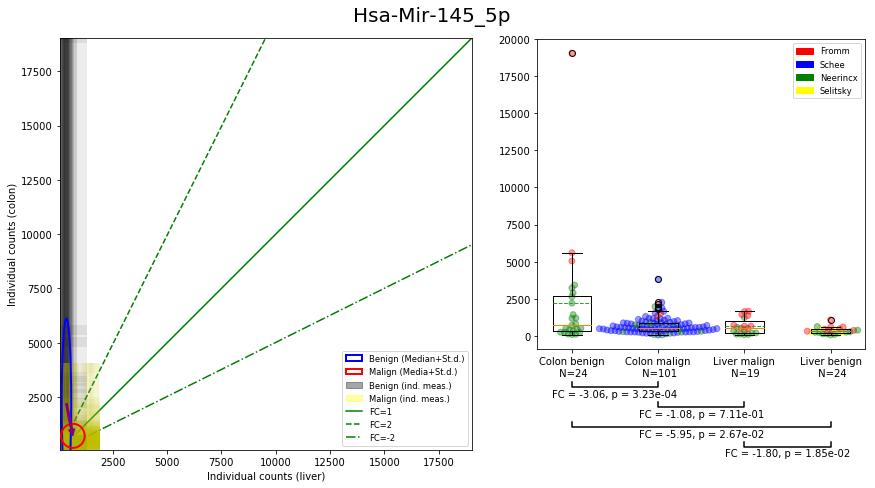

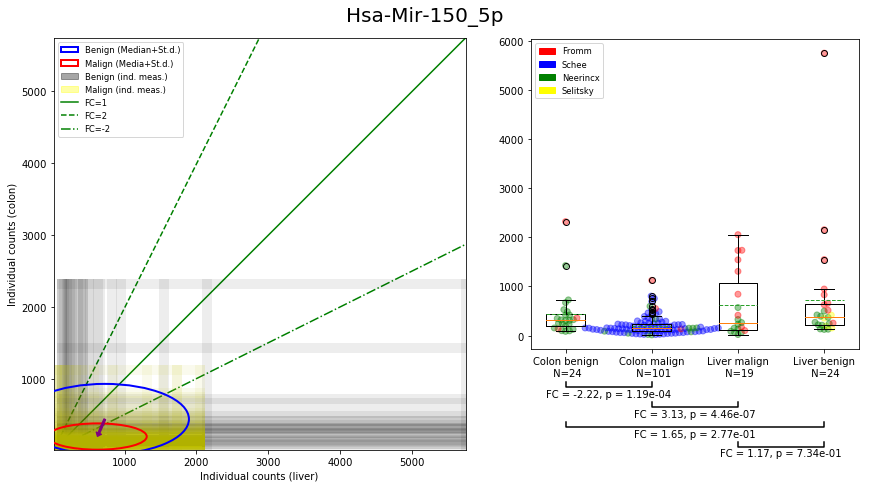

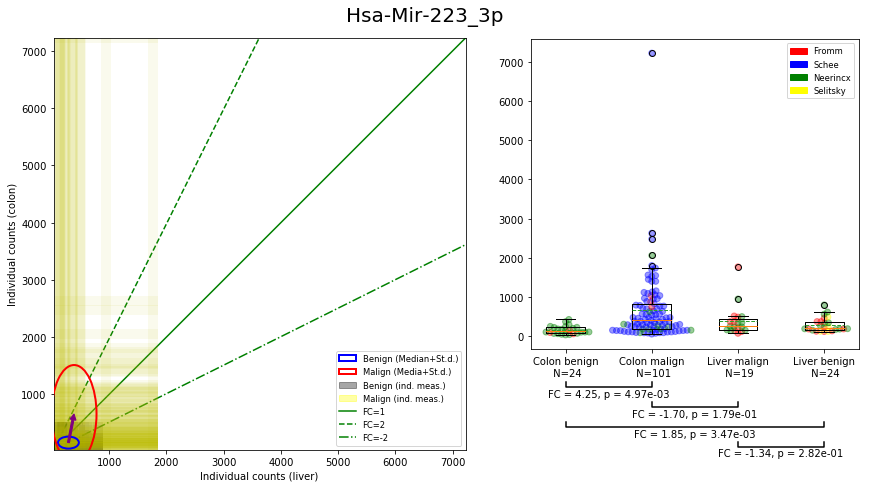

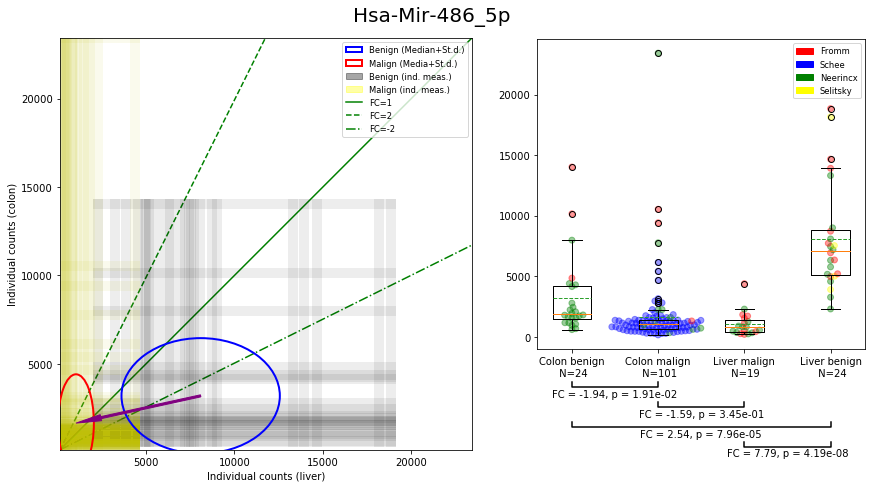

In [18]:
for item in list(mirnalist.query(query5).index):
    combplot(item)